In [1]:
import sys
wython = '/tigress/wenchang/wython'
TCI = '/tigress/wenchang/analysis/TCI'
if wython not in sys.path:
    sys.path.append(wython)
if TCI not in sys.path:
    sys.path.append(TCI)
from matplotlib import path
import xtc
import cftime
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
import potential_intensity
from wind_shear import wind_shear
from sklearn.cluster import KMeans
from scipy import stats
from matplotlib.lines import Line2D
from collections import Counter
from scipy.stats import kde
from datetime import datetime
import pickle



plt.rcParams['figure.dpi'] = 180

precip_sf = 3600*24

In [2]:
HIRAM = {"model":'HIRAM',
         "ctl": "CTL1990s_v201910_tigercpu_intelmpi_18_540PE",
         "plus2x": "CTL1990s_v201910_plus2xRegressedLMR2019SST_tigercpu_intelmpi_18_540PE",
         "tracktag": 'gav_ro110_2p5C_330k'
}    

AM25 = {"model":'AM2.5',
         "ctl": "CTL1990s_tigercpu_intelmpi_18_540PE",
         "plus2x": "CTL1990s_plus2xRegressedLMR2019SST_tigercpu_intelmpi_18_540PE",
         "tracktag": 'gav_ro110_1C_330k'
}    
 
AM25C360 = {"model":'AM2.5C360',
         "ctl": "CTL1990s_tigercpu_intelmpi_18_1080PE",
         "plus2x": "CTL1990s_plus2xRegressedLMR2019SST_tigercpu_intelmpi_18_1080PE",
         "tracktag": 'cyclones_gav_ro110_330k'
}

In [3]:
model_used = HIRAM
exp = model_used

{'model': 'AM2.5',
 'ctl': 'CTL1990s_tigercpu_intelmpi_18_540PE',
 'plus2x': 'CTL1990s_plus2xRegressedLMR2019SST_tigercpu_intelmpi_18_540PE',
 'tracktag': 'gav_ro110_1C_330k'}

# Loading climate data

In [4]:
precip_ctl = precip_sf*xr.open_dataarray(f'/tigress/tessj/data/%s.%s.atmos_month.precip.nc'%(exp['model'],exp['ctl'])) 
tsurf_ctl = xr.open_dataarray(f'/tigress/tessj/data/%s.%s.atmos_month.t_surf.nc'%(exp['model'],exp['ctl']))
v850_ctl = xr.open_dataarray(f'/tigress/tessj/data/%s.%s.atmos_month.v850.nc'%(exp['model'],exp['ctl']))
v200_ctl = xr.open_dataarray(f'/tigress/tessj/data/%s.%s.atmos_month.v200.nc'%(exp['model'],exp['ctl']))
u850_ctl = xr.open_dataarray(f'/tigress/tessj/data/%s.%s.atmos_month.u850.nc'%(exp['model'],exp['ctl']))
u200_ctl = xr.open_dataarray(f'/tigress/tessj/data/%s.%s.atmos_month.u200.nc'%(exp['model'],exp['ctl']))
wind_shear_ctl = wind_shear(u850_ctl, v850_ctl, u200_ctl, v200_ctl)
#omega500_ctl = xr.open_dataarray(f'/tigress/tessj/data/%s.%s.atmos_month.omega.500hPa.nc'%(exp['model'],exp['ctl']))


In [5]:
precip_2x = precip_sf*xr.open_dataarray(f'/tigress/tessj/data/%s.%s.atmos_month.precip.nc'%(exp['model'],exp['plus2x'])) 
tsurf_2x = xr.open_dataarray(f'/tigress/tessj/data/%s.%s.atmos_month.t_surf.nc'%(exp['model'],exp['plus2x']))
v850_2x = xr.open_dataarray(f'/tigress/tessj/data/%s.%s.atmos_month.v850.nc'%(exp['model'],exp['plus2x']))
v200_2x = xr.open_dataarray(f'/tigress/tessj/data/%s.%s.atmos_month.v200.nc'%(exp['model'],exp['plus2x']))
u850_2x = xr.open_dataarray(f'/tigress/tessj/data/%s.%s.atmos_month.u850.nc'%(exp['model'],exp['plus2x']))
u200_2x = xr.open_dataarray(f'/tigress/tessj/data/%s.%s.atmos_month.u200.nc'%(exp['model'],exp['plus2x']))
wind_shear_2x = wind_shear(u850_2x, v850_2x, u200_2x, v200_2x)
#omega500_2x = xr.open_dataarray(f'/tigress/tessj/data/%s.%s.atmos_month.omega.500hPa.nc'%(exp['model'],exp['plus2x']))


In [7]:
from xtc import tc_basins
def tracks_in_basin(ds, basin):
    '''Get the basin bool mask for the tracks dataset.
    **input**:
        ds: tracks dataset;
        basin: basin tag, e.g. "NA" for North Atlantic. 
    **return**:
        in_basin: DataArray of basin mask (bool values)'''
#     ds = xtc.tc_tracks('CTL1860_noleap_tigercpu_intelmpi_18_576PE', years=range(1,11))
#     basin = 'NA'
    # create basin_domain given basin tag, e.g. 'NA' (North Atlantic)
    basins = tc_basins()
    basin_index = basins.map_keys(basin)
    basin_domain = path.Path(basins.coords[basin_index])
    
    # create DataArray of lon/lat pairs
    lon = ds.lon.stack(i_stack=ds.lon.dims)
    lat = ds.lat.stack(i_stack=ds.lat.dims)
    lonlat = xr.concat([lon, lat], dim='lonlat').transpose()
    in_basin = lon.copy().astype('bool') # DataArray to hold the result
    
    # get the basin bool mask for all the tracks
    in_basin.data = basin_domain.contains_points(lonlat)
    in_basin = in_basin.unstack() # unstack to recover the original shape
    
    return in_basin

In [8]:
if exp==AM25C360:
    ds_ctl = xtc.tc_tracks(exp['ctl'], model=exp['model'],track_tag=exp['tracktag'],years=range(101,151))
elif exp==HIRAM:
    ds_ctl = xtc.tc_tracks(exp['ctl'], model=exp['model'],years=range(101,301))
else:
    ds_ctl = xtc.tc_tracks(exp['ctl'], model=exp['model'],years=range(101,201))

ds_ctl

years 0101-0300:
101; 102; 103; 104; 105; 106; 107; 108; 109; 110; 111; 112; 113; 114; 115; 116; 117; 118; 119; 120; 121; 122; 123; 124; 125; 126; 127; 128; 129; 130; 131; 132; 133; 134; 135; 136; 137; 138; 139; 140; 141; 142; 143; 144; 145; 146; 147; 148; 149; 150; 151; 152; 153; 154; 155; 156; 157; 158; 159; 160; 161; 162; 163; 164; 165; 166; 167; 168; 169; 170; 171; 172; 173; 174; 175; 176; 177; 178; 179; 180; 181; 182; 183; 184; 185; 186; 187; 188; 189; 190; 191; 192; 193; 194; 195; 196; 197; 198; 199; 200; 201; 202; 203; 204; 205; 206; 207; 208; 209; 210; 211; 212; 213; 214; 215; 216; 217; 218; 219; 220; 221; 222; 223; 224; 225; 226; 227; 228; 229; 230; 231; 232; 233; 234; 235; 236; 237; 238; 239; 240; 241; 242; 243; 244; 245; 246; 247; 248; 249; 250; 251; 252; 253; 254; 255; 256; 257; 258; 259; 260; 261; 262; 263; 264; 265; 266; 267; 268; 269; 270; 271; 272; 273; 274; 275; 276; 277; 278; 279; 280; 281; 282; 283; 284; 285; 286; 287; 288; 289; 290; 291; 292; 293; 294; 295; 296; 297

<xarray.Dataset>
Dimensions:  (stage: 120, storm: 200, year: 200)
Coordinates:
  * storm    (storm) int64 1 2 3 4 5 6 7 8 9 ... 193 194 195 196 197 198 199 200
  * stage    (stage) int64 0 6 12 18 24 30 36 42 ... 678 684 690 696 702 708 714
  * year     (year) int64 101 102 103 104 105 106 ... 295 296 297 298 299 300
Data variables:
    lat      (year, storm, stage) float64 -15.63 -15.84 -16.01 ... nan nan nan
    lon      (year, storm, stage) float64 176.1 177.0 178.5 ... nan nan nan
    windmax  (year, storm, stage) float64 18.71 16.41 17.8 20.89 ... nan nan nan
    slp      (year, storm, stage) float64 991.6 994.8 992.9 ... nan nan nan
    tm       (year, storm, stage) float64 261.3 -1.0 -1.0 263.8 ... nan nan nan
    month    (year, storm, stage) float64 1.0 1.0 1.0 1.0 ... nan nan nan nan
    day      (year, storm, stage) float64 1.0 1.0 1.0 1.0 ... nan nan nan nan
    hour     (year, storm, stage) float64 6.0 12.0 18.0 24.0 ... nan nan nan nan

In [9]:
if exp==AM25C360:
    ds_2x = xtc.tc_tracks(exp['plus2x'], model=exp['model'],track_tag=exp['tracktag'],years=range(101,151))
elif exp==HIRAM:
    ds_2x = xtc.tc_tracks(exp['plus2x'], model=exp['model'],years=range(101,301))
else:
    ds_2x = xtc.tc_tracks(exp['plus2x'], model=exp['model'],years=range(101,201))

ds_2x

years 0101-0300:
101; 102; 103; 104; 105; 106; 107; 108; 109; 110; 111; 112; 113; 114; 115; 116; 117; 118; 119; 120; 121; 122; 123; 124; 125; 126; 127; 128; 129; 130; 131; 132; 133; 134; 135; 136; 137; 138; 139; 140; 141; 142; 143; 144; 145; 146; 147; 148; 149; 150; 151; 152; 153; 154; 155; 156; 157; 158; 159; 160; 161; 162; 163; 164; 165; 166; 167; 168; 169; 170; 171; 172; 173; 174; 175; 176; 177; 178; 179; 180; 181; 182; 183; 184; 185; 186; 187; 188; 189; 190; 191; 192; 193; 194; 195; 196; 197; 198; 199; 200; 201; 202; 203; 204; 205; 206; 207; 208; 209; 210; 211; 212; 213; 214; 215; 216; 217; 218; 219; 220; 221; 222; 223; 224; 225; 226; 227; 228; 229; 230; 231; 232; 233; 234; 235; 236; 237; 238; 239; 240; 241; 242; 243; 244; 245; 246; 247; 248; 249; 250; 251; 252; 253; 254; 255; 256; 257; 258; 259; 260; 261; 262; 263; 264; 265; 266; 267; 268; 269; 270; 271; 272; 273; 274; 275; 276; 277; 278; 279; 280; 281; 282; 283; 284; 285; 286; 287; 288; 289; 290; 291; 292; 293; 294; 295; 296; 297

<xarray.Dataset>
Dimensions:  (stage: 120, storm: 200, year: 200)
Coordinates:
  * storm    (storm) int64 1 2 3 4 5 6 7 8 9 ... 193 194 195 196 197 198 199 200
  * stage    (stage) int64 0 6 12 18 24 30 36 42 ... 678 684 690 696 702 708 714
  * year     (year) int64 101 102 103 104 105 106 ... 295 296 297 298 299 300
Data variables:
    lat      (year, storm, stage) float64 6.18 6.64 7.11 7.59 ... nan nan nan
    lon      (year, storm, stage) float64 73.37 72.37 71.36 ... nan nan nan
    windmax  (year, storm, stage) float64 18.37 17.41 18.24 ... nan nan nan
    slp      (year, storm, stage) float64 1.006e+03 1.001e+03 ... nan nan
    tm       (year, storm, stage) float64 258.5 258.7 258.7 ... nan nan nan
    month    (year, storm, stage) float64 1.0 1.0 1.0 1.0 ... nan nan nan nan
    day      (year, storm, stage) float64 1.0 1.0 1.0 1.0 ... nan nan nan nan
    hour     (year, storm, stage) float64 6.0 12.0 18.0 24.0 ... nan nan nan nan

In [10]:
inNA_ctl = tracks_in_basin(ds_ctl, 'NA')
inNA_2x = tracks_in_basin(ds_2x, 'NA')
ds_ctl_NA = ds_ctl.where(inNA_ctl,drop=True)
ds_2x_NA = ds_2x.where(inNA_2x,drop=True)

# Some timeseries

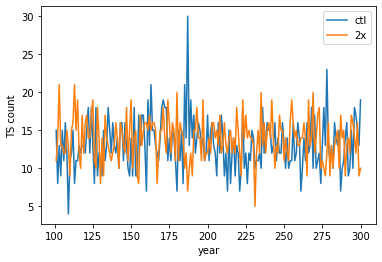

In [8]:
#ts per year = tspy
tspy_ctl_NA = []
for i in ds_ctl_NA.year:
    tspy_ctl_NA.append(len(ds_ctl_NA.sel(year=i).dropna('storm',how='all').storm))
plt.plot(ds_ctl_NA.year,tspy_ctl_NA,label='ctl')
tspy_2x_NA = []
for i in ds_2x_NA.year:
    tspy_2x_NA.append(len(ds_2x_NA.sel(year=i).dropna('storm',how='all').storm))
plt.plot(ds_2x_NA.year,tspy_2x_NA,label='2x')
plt.ylabel('TS count')
plt.xlabel('year')
plt.legend()

In [9]:
print(f'fractional change={(sum(tspy_2x_NA)-sum(tspy_ctl_NA))/sum(tspy_ctl_NA)}, average change in number of TS per year={np.mean([a_i - b_i for a_i, b_i in zip(tspy_2x_NA, tspy_ctl_NA)])}')

fractional change=0.053313023610053314, average change in number of TS per year=0.7


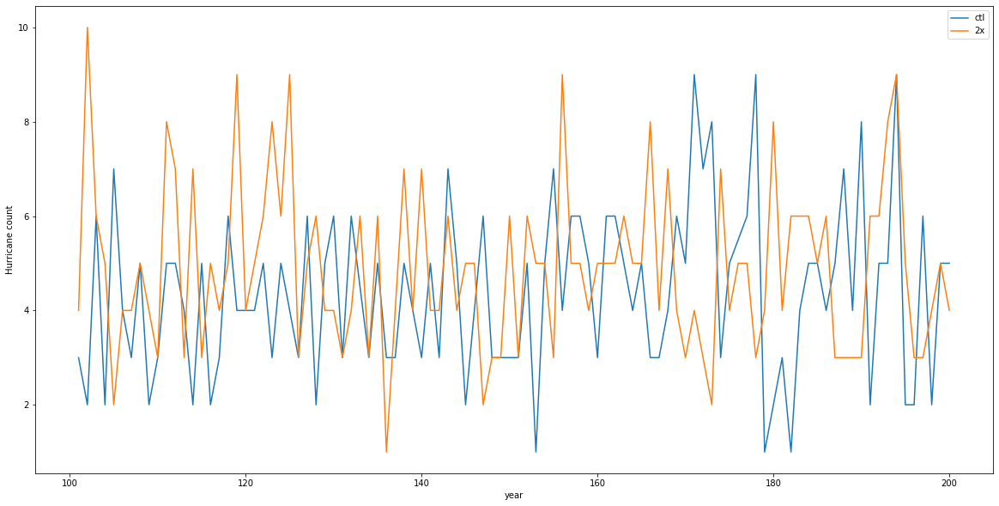

In [12]:
ds_ctl_NA_hur = ds_ctl_NA.where(ds_ctl_NA.windmax>33.,drop=True)
ds_2x_NA_hur = ds_2x_NA.where(ds_2x_NA.windmax>33.,drop=True)

plt.figure(figsize=(20,10))
hpy_ctl_NA = []
for i in ds_ctl_NA_hur.year:
    hpy_ctl_NA.append(len(ds_ctl_NA_hur.sel(year=i).dropna('storm',how='all').storm))
plt.plot(ds_ctl_NA_hur.year,hpy_ctl_NA,label='ctl')
hpy_2x_NA = []
for i in ds_2x_NA_hur.year:
    hpy_2x_NA.append(len(ds_2x_NA_hur.sel(year=i).dropna('storm',how='all').storm))
plt.plot(ds_2x_NA_hur.year,hpy_2x_NA,label='2x')
plt.ylabel('Hurricane count')
plt.xlabel('year')#
plt.legend()

In [13]:
print(f'fractional change={(sum(hpy_2x_NA)-sum(hpy_ctl_NA))/sum(hpy_ctl_NA)}, average change in number of TC per year={np.mean([a_i - b_i for a_i, b_i in zip(hpy_2x_NA, hpy_ctl_NA)])}')

fractional change=0.1405152224824356, average change in number of TC per year=0.5714285714285714


# TC density

In [14]:
density_ctl_NA = xtc.tc_density(ds_ctl_NA).mean('time')
density_2x_NA = xtc.tc_density(ds_2x_NA).mean('time')
density_ctl = xtc.tc_density(ds_ctl).mean('time')
density_2x = xtc.tc_density(ds_2x).mean('time')

/home/tessj/anaconda3/lib/python3.7/site-packages/xarray/core/nanops.py:140: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)
/home/tessj/anaconda3/lib/python3.7/site-packages/xarray/core/nanops.py:140: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)
/home/tessj/anaconda3/lib/python3.7/site-packages/xarray/core/nanops.py:140: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)
/home/tessj/anaconda3/lib/python3.7/site-packages/xarray/core/nanops.py:140: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)


Text(0.5, 1.0, 'TC days per month per 10x10deg box')

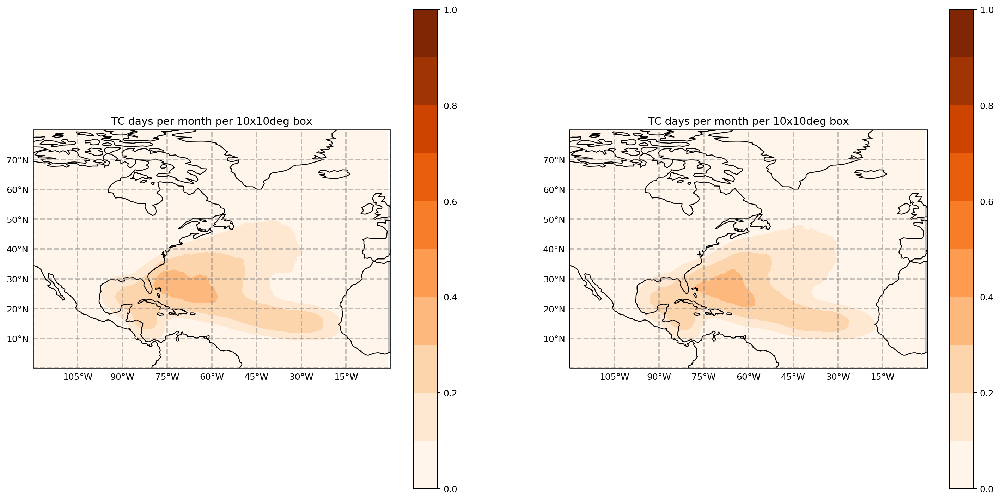

In [104]:
plt.figure(figsize=(20,10))
ax1=plt.subplot(1,2,1,projection=ccrs.PlateCarree())
ax1.set_extent([-120,0,0, 80], ccrs.PlateCarree())
density_ctl_NA.plot.contourf(robust=True,cmap='Oranges',vmax=1,levels=11)
ax1.add_feature(cfeature.LAND, facecolor='0.75')
gl=ax1.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=1.5, color='gray', alpha=0.5, linestyle='--')
gl.xlabels_top=False
gl.ylabels_right=False
gl.xformatter=LONGITUDE_FORMATTER
gl.yformatter=LATITUDE_FORMATTER
ax1.coastlines()
ax1.set_title('TC days per month per 10x10deg box')

ax1=plt.subplot(1,2,2,projection=ccrs.PlateCarree())
ax1.set_extent([-120,0,0, 80], ccrs.PlateCarree())
density_2x_NA.plot.contourf(robust=True,cmap='Oranges',vmax=1,levels=11)
ax1.add_feature(cfeature.LAND, facecolor='0.75')
gl=ax1.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=1.5, color='gray', alpha=0.5, linestyle='--')
gl.xlabels_top=False
gl.ylabels_right=False
gl.xformatter=LONGITUDE_FORMATTER
gl.yformatter=LATITUDE_FORMATTER
ax1.coastlines()
ax1.set_title('TC days per month per 10x10deg box')

Text(0.5, 1.0, '$\\Delta$ TC days per month per 10x10deg box')

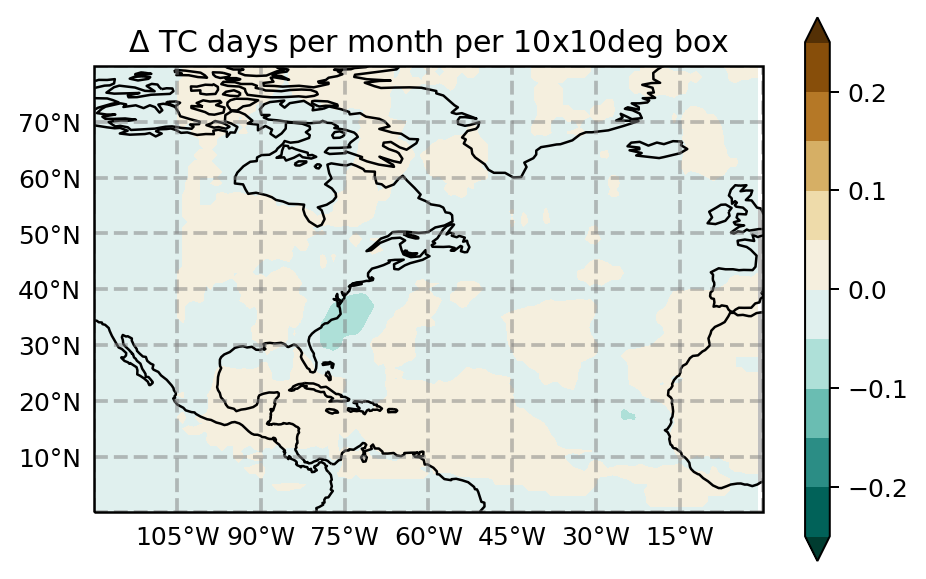

In [105]:
ax1=plt.subplot(1,1,1,projection=ccrs.PlateCarree())
ax1.set_extent([-120,0,0, 80], ccrs.PlateCarree())
(density_2x_NA - density_ctl_NA).plot.contourf(robust=True,cmap='BrBG_r',vmin=-0.25,vmax=0.25,levels=11,extend='both')
ax1.add_feature(cfeature.LAND, facecolor='0.75')
gl=ax1.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=1.5, color='gray', alpha=0.5, linestyle='--')
gl.xlabels_top=False
gl.ylabels_right=False
gl.xformatter=LONGITUDE_FORMATTER
gl.yformatter=LATITUDE_FORMATTER
ax1.coastlines()
ax1.set_title('$\Delta$ TC days per month per 10x10deg box')

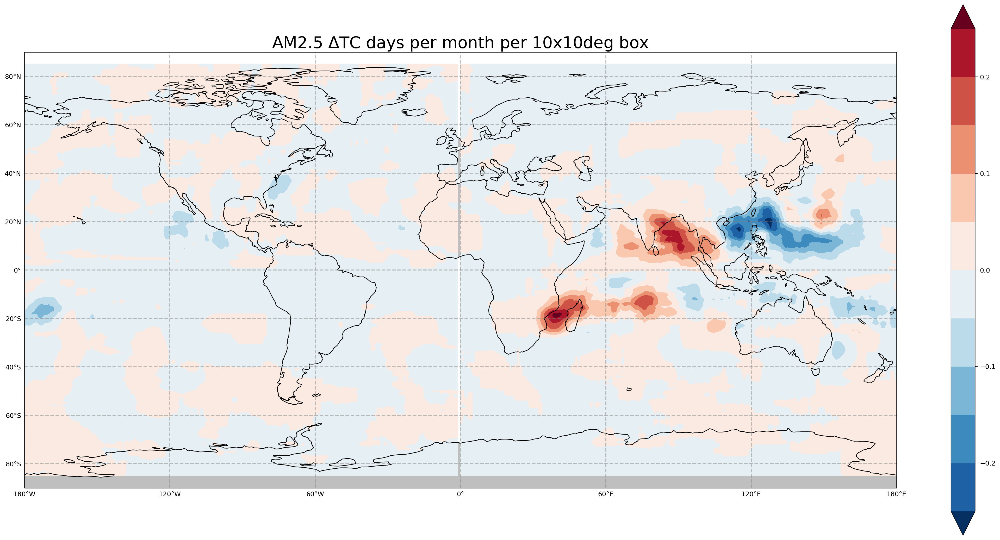

In [106]:
plt.figure(figsize=(30,15))
ax1=plt.subplot(1,1,1,projection=ccrs.PlateCarree())
(density_2x - density_ctl).plot.contourf(robust=True,cmap='RdBu_r',vmin=-0.25,vmax=0.25,levels=11,extend='both')
ax1.add_feature(cfeature.LAND, facecolor='0.75')
gl=ax1.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=1.5, color='gray', alpha=0.5, linestyle='--')
gl.xlabels_top=False
gl.ylabels_right=False
gl.xformatter=LONGITUDE_FORMATTER
gl.yformatter=LATITUDE_FORMATTER
ax1.coastlines()
ax1.set_title(f'%s $\Delta$TC days per month per 10x10deg box'%exp['model'],fontsize=25)

#plt.savefig(f'%s_tc_density.png'%exp['model'])

# Precip, windshear, omega

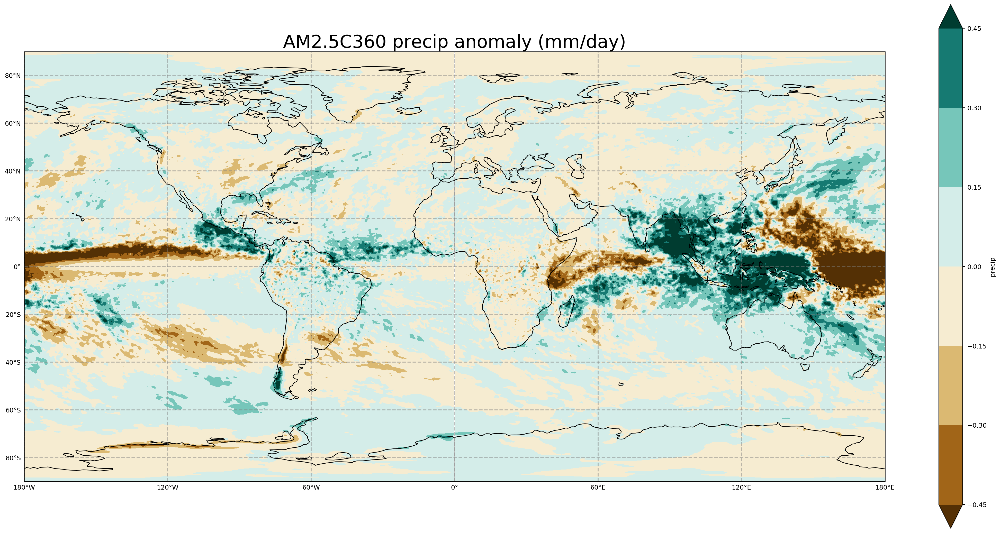

In [111]:
plt.figure(figsize=(30,15))
ax1=plt.subplot(1,1,1,projection=ccrs.PlateCarree())
(precip_2x - precip_ctl).mean('time').plot.contourf(robust=True,cmap='BrBG')#,vmin=-0.25,vmax=0.25,levels=11,extend='both')
ax1.add_feature(cfeature.LAND, facecolor='0.75')
gl=ax1.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=1.5, color='gray', alpha=0.5, linestyle='--')
gl.xlabels_top=False
gl.ylabels_right=False
gl.xformatter=LONGITUDE_FORMATTER
gl.yformatter=LATITUDE_FORMATTER
ax1.coastlines()
ax1.set_title(f'%s precip anomaly (mm/day)'%exp['model'],fontsize=28)

plt.savefig(f'%s_precip.png'%exp['model'])

Text(0.5, 1.0, 'AM2.5 tsurf anomaly (K)')

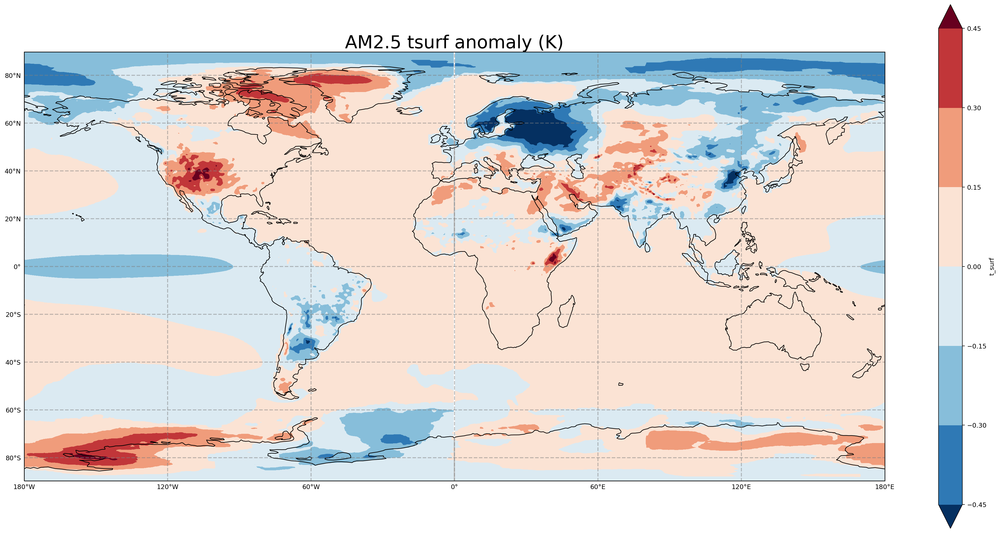

In [32]:
plt.figure(figsize=(30,15))
ax1=plt.subplot(1,1,1,projection=ccrs.PlateCarree())
(tsurf_2x - tsurf_ctl).mean('time').plot.contourf(robust=True,cmap='RdBu_r')#,vmin=-0.25,vmax=0.25,levels=11,extend='both')
ax1.add_feature(cfeature.LAND, facecolor='0.75')
gl=ax1.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=1.5, color='gray', alpha=0.5, linestyle='--')
gl.xlabels_top=False
gl.ylabels_right=False
gl.xformatter=LONGITUDE_FORMATTER
gl.yformatter=LATITUDE_FORMATTER
ax1.coastlines()

ax1.set_title(f'%s tsurf anomaly (K)'%exp['model'],fontsize=28)


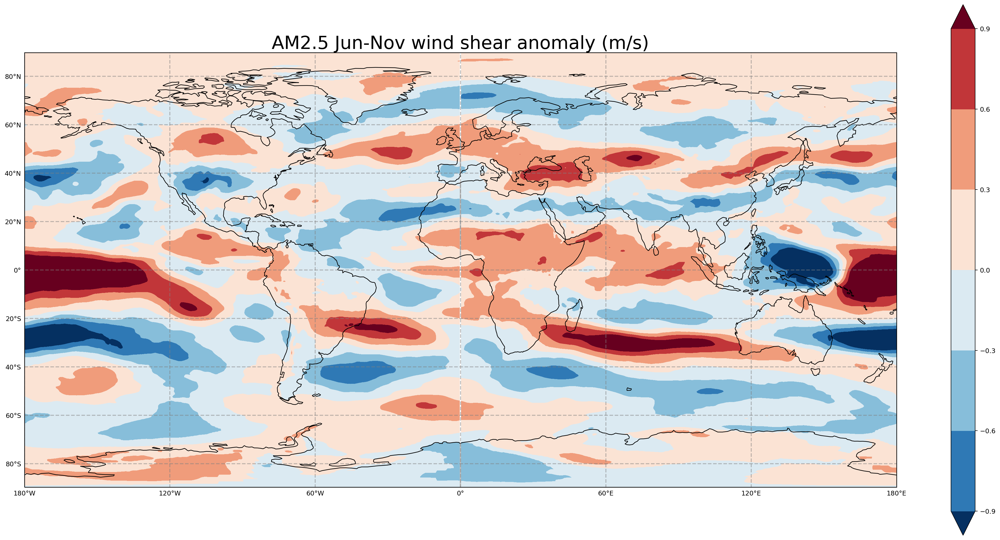

In [33]:
plt.figure(figsize=(30,15))
ax1=plt.subplot(1,1,1,projection=ccrs.PlateCarree())
(wind_shear_2x - wind_shear_ctl).groupby('time.month').mean('time').sel(month=[6,7,8,9,10,11]).mean('month').plot.contourf(robust=True,cmap='RdBu_r')#,vmin=-0.25,vmax=0.25,levels=11,extend='both')
ax1.add_feature(cfeature.LAND, facecolor='0.75')
gl=ax1.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=1.5, color='gray', alpha=0.5, linestyle='--')
gl.xlabels_top=False
gl.ylabels_right=False
gl.xformatter=LONGITUDE_FORMATTER
gl.yformatter=LATITUDE_FORMATTER
ax1.coastlines()
ax1.set_title(f'%s Jun-Nov wind shear anomaly (m/s)'%exp['model'],fontsize=28)
#plt.savefig(f'%s_windshear.png'%exp['model'])

Text(0.5, 1.0, 'AM2.5 Jun-Nov $\\omega_{500hPa}$ anomaly (Pa/s)')

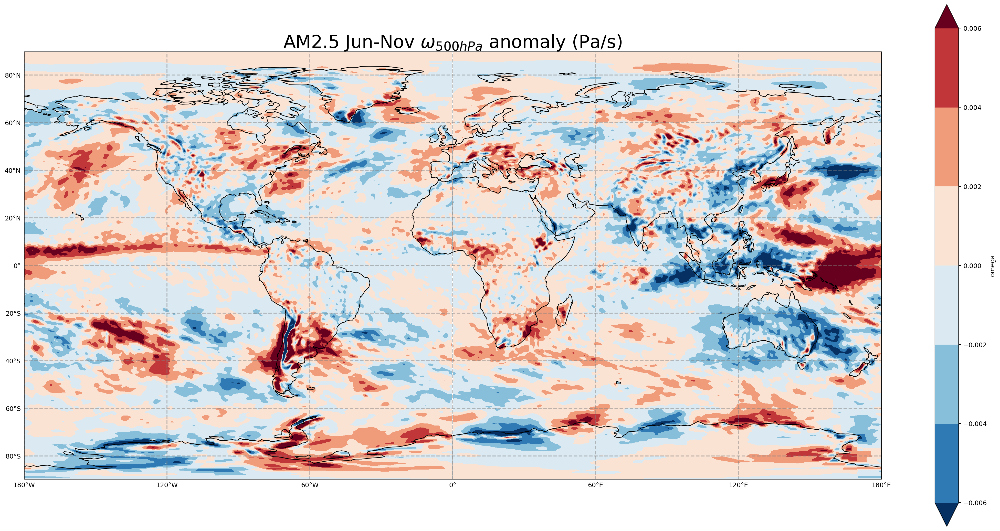

In [34]:
plt.figure(figsize=(30,15))
ax1=plt.subplot(1,1,1,projection=ccrs.PlateCarree())
(omega500_2x - omega500_ctl).groupby('time.month').mean('time').sel(month=[6,7,8,9,10,11]).mean('month').plot.contourf(robust=True,cmap='RdBu_r')#,vmin=-0.25,vmax=0.25,levels=11,extend='both')
ax1.add_feature(cfeature.LAND, facecolor='0.75')
gl=ax1.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=1.5, color='gray', alpha=0.5, linestyle='--')
gl.xlabels_top=False
gl.ylabels_right=False
gl.xformatter=LONGITUDE_FORMATTER
gl.yformatter=LATITUDE_FORMATTER
ax1.coastlines()
ax1.set_title(f'%s Jun-Nov $\omega_{{500hPa}}$ anomaly (Pa/s)'%exp['model'],fontsize=28)

#plt.savefig(f'%s_omega500.png'%exp['model'])

In [25]:
testlist_lats = [1,2,3,4,5]
testlist_lons = [1,2,3,4,5]
if any(x>5 for x in testlist_lats) & any(x<3 for x in testlist_lons):
    print('yes')


<generator object <genexpr> at 0x7fc8bc308f48>


In [86]:
for i in range(len(lons)):
    idx = [i for i, val in enumerate(lons[i]) if val < 300] 
    if any(lats[i][x]>17 for x in idx):
        print('yes')
    else:
        print('no')

yes
yes
yes
yes
yes
yes
no
yes
yes
no
yes
no
yes
yes
yes
yes
yes
yes
no
no
yes
yes
yes
yes
no
yes
yes
no
yes
yes
yes
yes
yes
yes
yes
yes
no
yes
no
no
no
yes
yes
yes
yes
yes
yes
yes
no
yes
yes
yes
yes
yes
yes
yes
no
no
yes
no
yes
no
yes
yes
yes
yes
no
yes
yes
no
yes
no
no
no
yes
yes
yes
yes
yes
yes
no
no
yes
yes
yes
yes
yes
no
yes
yes
no
no
no
no
yes
no
no
no
yes
yes
no
yes
yes
no
yes
yes
yes
no
no
yes
yes
yes
no
yes
yes
no
yes
yes
no
yes
no
yes
no
no
yes
yes
yes
yes
yes
no
no
no
no
yes
no
no
yes
no
yes
yes
no
yes
no
yes
yes
no
no
yes
no
no
yes
no
no
no
yes
yes
yes
no
no
yes
yes
yes
no
yes
yes
yes
no
yes
no
yes
yes
yes
yes
no
yes
no
yes
yes
yes
no
yes
yes
yes
no
yes
yes
yes
yes
yes
yes
yes
yes
yes
no
yes
yes
no
yes
no
yes
yes
yes
yes
no
yes
yes
yes
yes
yes
no
no
no
yes
no
no
yes
yes
yes
yes
no
yes
no
no
yes
yes
no
yes
no
yes
yes
yes
no
yes
no
no
no
yes
yes
yes
no
no
no
yes
yes
yes
yes
no
yes
no
no
yes
no
yes
yes
no
no
no
yes
no
yes
yes
yes
yes
yes
no
yes
yes
yes
no
yes
yes
no
yes
yes
no

In [196]:
lats[-4]

[26.64,
 26.39,
 26.23,
 26.1,
 25.9,
 25.89,
 26.39,
 27.19,
 28.0,
 28.73,
 29.61,
 30.58,
 31.52,
 32.37,
 33.43,
 34.65,
 36.22,
 38.08,
 40.62,
 43.64,
 47.2,
 52.33,
 54.44,
 56.85,
 57.13,
 57.27,
 57.76,
 58.35,
 58.32,
 57.79,
 58.15,
 58.65,
 59.05,
 59.76,
 60.5,
 61.26,
 62.36,
 63.67,
 64.89,
 65.62,
 65.73,
 65.61,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan]

In [35]:
count

[1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 90,
 91,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99,
 100,
 101,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 116,
 117,
 118,
 119,
 120,
 121,
 122,
 123,
 124,
 125,
 126,
 127,
 128,
 129,
 130,
 131,
 132,
 133,
 134,
 135,
 136,
 137,
 138,
 139,
 140,
 141,
 142,
 143,
 144,
 145,
 146,
 147,
 148,
 149,
 150,
 151,
 152,
 153,
 154,
 155,
 156,
 157,
 158,
 159,
 160,
 161,
 162,
 163,
 164,
 165,
 166,
 167,
 168,
 169,
 170,
 171,
 172,
 173,
 174,
 175,
 176,
 177,
 178,
 179,
 180,
 181,
 182,
 183,
 184,
 185

# Create storms dataset with restrictions

In [4]:
#windspeed threshhold v
v = 15.

In [429]:
# make dataset with vector to cluster by (for this we wanna do locations of: gensis,lysis,and windmax)
count = []
year = []
month = []
lats = []
lons = []

#genesis and lysis are indices of the stage of genesis & lysis 
genesis = []
lysis = []
winds = []
lat_gen = []
lon_gen = []
lat_lys = []
lon_lys = []
lat_max = []
lon_max = []
wind_max = []
exp = []
ew_basin = []
n=1
for i in range(len(ds_ctl_NA.year)):
    for ii in range(len(ds_ctl_NA.storm)):
        if not np.isnan(ds_ctl_NA.isel(year=i,storm=ii).lat).all():
            m=0
            ly=0
            for iii in range(len(ds_ctl_NA.stage)):
                if ((m==0) & (ds_ctl_NA.isel(year=i,storm=ii,stage=iii).windmax.item() >v) & (ds_ctl_NA.isel(year=i,storm=ii,stage=iii).tm.item() >0.)):
                    genesis.append(iii)
                    m=1
                if ((ds_ctl_NA.isel(year=i,storm=ii,stage=iii).windmax.item() >v) | (ds_ctl_NA.isel(year=i,storm=ii,stage=iii).tm.item() >0.)):
                    ly=iii
            if m==1:
                lysis.append(ly)
                lat_gen.append(ds_ctl_NA.isel(year=i,storm=ii,stage=genesis[-1]).lat.item())
                lon_gen.append(ds_ctl_NA.isel(year=i,storm=ii,stage=genesis[-1]).lon.item())
                lat_lys.append(ds_ctl_NA.isel(year=i,storm=ii,stage=lysis[-1]).lat.item())
                lon_lys.append(ds_ctl_NA.isel(year=i,storm=ii,stage=lysis[-1]).lon.item())
            #lat_gen.append(lats[-1][0])
            #lon_gen.append(lons[-1][0])
            #lat_lys.append(lats[-1][-1])
            #lon_lys.append(lons[-1][-1])
                count.append(n)
                n+=1
                year.append(ds_ctl_NA.isel(year=i,storm=ii).year.item())
                month.append(ds_ctl_NA.isel(year=i,storm=ii, stage=genesis[-1]).month.item())
                lats.append(ds_ctl_NA.isel(year=i,storm=ii).lat.values.tolist())
                lons.append(ds_ctl_NA.isel(year=i,storm=ii).lon.values.tolist())
                winds.append(ds_ctl_NA.isel(year=i,storm=ii).windmax.values.tolist())
                lat_max.append(lats[-1][np.nanargmax(winds[-1])])
                lon_max.append(lons[-1][np.nanargmax(winds[-1])])
                wind_max.append(max(winds[-1]))
                exp.append('CTL')
                #idx = [i for i, val in enumerate(ds_ctl_NA.isel(year=i,storm=ii).lon.values.tolist()) if val < 300] 
                #if any((ds_ctl_NA.isel(year=i,storm=ii).lat.values.tolist())[x]>17 for x in idx):
                #    ew_basin.append('EAST')
                #else:
                #    ew_basin.append('WEST')

In [430]:
for i in range(len(ds_2x_NA.year)):
    for ii in range(len(ds_2x_NA.storm)):
        if not np.isnan(ds_2x_NA.isel(year=i,storm=ii).lat).all():
            m=0
            ly=0
            for iii in range(len(ds_2x_NA.stage)):
                if ((m==0)&(ds_2x_NA.isel(year=i,storm=ii,stage=iii).windmax.item() >v) & (ds_2x_NA.isel(year=i,storm=ii,stage=iii).tm.item() >0.)):
                    genesis.append(iii)
                    m=1
                if ((ds_2x_NA.isel(year=i,storm=ii,stage=iii).windmax.item() >v) | (ds_2x_NA.isel(year=i,storm=ii,stage=iii).tm.item() >0.)):
                    ly=iii
            if m==1:
                lysis.append(ly)
                lat_gen.append(ds_2x_NA.isel(year=i,storm=ii,stage=genesis[-1]).lat.item())
                lon_gen.append(ds_2x_NA.isel(year=i,storm=ii,stage=genesis[-1]).lon.item())
                lat_lys.append(ds_2x_NA.isel(year=i,storm=ii,stage=lysis[-1]).lat.item())
                lon_lys.append(ds_2x_NA.isel(year=i,storm=ii,stage=lysis[-1]).lon.item())
            #lat_gen.append(lats[-1][0])
            #lon_gen.append(lons[-1][0])
            #lat_lys.append(lats[-1][-1])
            #lon_lys.append(lons[-1][-1])
                count.append(n)
                n+=1
                year.append(ds_2x_NA.isel(year=i,storm=ii).year.item())
                month.append(ds_2x_NA.isel(year=i,storm=ii,stage=genesis[-1]).month.item())
                lats.append(ds_2x_NA.isel(year=i,storm=ii).lat.values.tolist())
                lons.append(ds_2x_NA.isel(year=i,storm=ii).lon.values.tolist())
                winds.append(ds_2x_NA.isel(year=i,storm=ii).windmax.values.tolist())
                lat_max.append(lats[-1][np.nanargmax(winds[-1])])
                lon_max.append(lons[-1][np.nanargmax(winds[-1])])
                wind_max.append(max(winds[-1]))
                exp.append('2X')
                #idx = [i for i, val in enumerate(ds_2x_NA.isel(year=i,storm=ii).lon.values.tolist()) if val < 300] 
                #if any((ds_2x_NA.isel(year=i,storm=ii).lat.values.tolist())[x]>17 for x in idx):
                #    ew_basin.append('EAST')
                #else:
                #    ew_basin.append('WEST')
               

In [431]:
 
# make it into a dataarray
index = list(range(0,len(count)))
Count = xr.DataArray(count, coords=[index], dims=['index'])
Lat_gen = xr.DataArray(lat_gen, coords=[index], dims=['index'])
Lon_gen = xr.DataArray(lon_gen, coords=[index], dims=['index'])
Lat_lys = xr.DataArray(lat_lys, coords=[index], dims=['index'])
Lon_lys = xr.DataArray(lon_lys, coords=[index], dims=['index'])
Lat_max = xr.DataArray(lat_max, coords=[index], dims=['index'])
Lon_max = xr.DataArray(lon_max, coords=[index], dims=['index'])
Wind_max = xr.DataArray(wind_max, coords=[index], dims=['index'])
Genesis = xr.DataArray(genesis, coords=[index], dims=['index'])
Lysis = xr.DataArray(lysis, coords=[index], dims=['index'])
Year = xr.DataArray(year, coords=[index], dims=['index'])
Month =  xr.DataArray(month, coords=[index], dims=['index'])
Experiment = xr.DataArray(exp, coords=[index], dims=['index'])
#EW = xr.DataArray(ew_basin,coords=[index],dims=['index'])

In [432]:

all_storms_ds = xr.merge([xr.DataArray(Count, name='Count'), xr.DataArray(Lat_gen, name='Lat_gen'), 
                          xr.DataArray(Lon_gen, name='Lon_gen'), xr.DataArray(Lat_lys, name='Lat_lys'), 
                          xr.DataArray(Lon_lys, name='Lon_lys'), xr.DataArray(Lat_max, name='Lat_max'),
                         xr.DataArray(Lon_max, name='Lon_max'),xr.DataArray(Wind_max, name='Wind_max'),xr.DataArray(Genesis, name='Genesis'),xr.DataArray(Lysis, name='Lysis'),xr.DataArray(Year, name='Year'),xr.DataArray(Month, name='Mon'),xr.DataArray(Experiment, name='Experiment')])



In [436]:
exp=model_used
lats_out = open(f'lats_%s_%dms.pickle'%(exp['model'],v),'wb')
lons_out = open(f'lons_%s_%dms.pickle'%(exp['model'],v),'wb')
pickle.dump(lats,lats_out)
pickle.dump(lons,lons_out)

In [434]:
exp=model_used

loc = f'/tigress/tessj/data/%s_all_storms_%dms.nc'%(exp['model'],v)
all_storms_ds.to_netcdf(loc)
#all_storms_ds = xr.open_dataset(loc)

# East/West basin counts

In [137]:
v=15
lats_in = open(f'lats_%s_%dms.pickle'%(exp['model'],v),'rb')
lons_in = open(f'lons_%s_%dms.pickle'%(exp['model'],v),'rb')
lats = pickle.load(lats_in)
lons = pickle.load(lons_in)

In [125]:
df_ctl_NA = xr.Dataset.to_dataframe(ds_ctl_NA)
df_2x_NA = xr.Dataset.to_dataframe(ds_2x_NA)

exp=model_used
#v = 15.
all_storms_ds = xr.open_dataset(f'/tigress/tessj/data/%s_all_storms_%dms.nc'%(exp['model'],v))
all_storms_df = xr.Dataset.to_dataframe(all_storms_ds)

#e_w = []
#e_w.append(all_storms_df[all_storms_df.EW=='EAST'])
#e_w.append(all_storms_df[all_storms_df.EW=='WEST'])

In [112]:
#50 YEAR CHUNKS HIRAM ONLY
#all_storms_df = all_storms_df[(all_storms_df.Year>=251)]
#good_indices = list(all_storms_df[all_storms_df.Year>=251].index)
#lats = [lats[i] for i in good_indices]
#lons = [lons[i] for i in good_indices]

In [113]:
#100 YEAR CHUNKS HIRAM ONLY
#all_storms_df = all_storms_df[(all_storms_df.Year>=201)]
#good_indices = list(all_storms_df[all_storms_df.Year>=201].index)
#lats = [lats[i] for i in good_indices]
#lons = [lons[i] for i in good_indices]

In [114]:
len(lats)

131

In [115]:
exp_labels = all_storms_df.Experiment.values.tolist()
lats_ctl=[]
lats_2x=[]
lons_ctl=[]
lons_2x=[]

for i in range(len(lats)):
    if exp_labels[i]=='CTL':
        lats_ctl.append(lats[i])
        lons_ctl.append(lons[i])
    if exp_labels[i]=='2X':
        lats_2x.append(lats[i])
        lons_2x.append(lons[i])

In [116]:
#storms_2x

In [117]:
lon_cutoffs = range(270,345)
storms_ctl=[]
storms_2x=[]

for l in lon_cutoffs:
    total_ctl = 0
    total_2x=0
    for i in range(len(lats_ctl)):
        idx = [i for i, val in enumerate(lons_ctl[i]) if val < l] 
        if any(lats_ctl[i][x]>17 for x in idx):
            total_ctl+=1
    storms_ctl.append(total_ctl)
    for i in range(len(lats_2x)):
        idx = [i for i, val in enumerate(lons_2x[i]) if val < l] 
        if any(lats_2x[i][x]>17 for x in idx):
            total_2x+=1
    storms_2x.append(total_2x)
            
storms_per = list((y-x)*100/x for x, y in zip(storms_ctl,storms_2x))

In [118]:
storms_per_out = open(f'storms_per_%s_%dms_201_301.pickle'%(exp['model'],v),'wb')
pickle.dump(storms_per,storms_per_out)

storms_per_out = open(f'storms_per_%s_%dms.pickle_201_301'%(exp['model'],v),'wb')
pickle.dump(storms_per,storms_per_out)

In [119]:
storms_per_in = open(f'storms_per_HIRAM.pickle','rb') #17ms
storms_per_HIRAM = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_HIRAM_15ms.pickle','rb')
storms_per_HIRAM_15ms = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_HIRAM_15ms_101_151.pickle','rb')
storms_per_HIRAM_15ms_101_151 = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_HIRAM_15ms_151_201.pickle','rb')
storms_per_HIRAM_15ms_151_201 = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_HIRAM_15ms_201_251.pickle','rb')
storms_per_HIRAM_15ms_201_251 = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_HIRAM_15ms_251_301.pickle','rb')
storms_per_HIRAM_15ms_251_301 = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_HIRAM_15ms_101_201.pickle','rb')
storms_per_HIRAM_15ms_101_201 = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_HIRAM_15ms_201_301.pickle','rb')
storms_per_HIRAM_15ms_201_301 = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_HIRAM_13ms.pickle','rb')
storms_per_HIRAM_13ms = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_HIRAM_20ms.pickle','rb')
storms_per_HIRAM_20ms = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_HIRAM_20ms_101_151.pickle','rb')
storms_per_HIRAM_20ms_101_151 = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_HIRAM_20ms_151_201.pickle','rb')
storms_per_HIRAM_20ms_151_201 = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_HIRAM_20ms_201_251.pickle','rb')
storms_per_HIRAM_20ms_201_251 = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_HIRAM_20ms_251_301.pickle','rb')
storms_per_HIRAM_20ms_251_301 = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_HIRAM_20ms_101_201.pickle','rb')
storms_per_HIRAM_20ms_101_201 = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_HIRAM_20ms_201_301.pickle','rb')
storms_per_HIRAM_20ms_201_301 = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_HIRAM_25ms.pickle','rb')
storms_per_HIRAM_25ms = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_HIRAM_25ms_101_151.pickle','rb')
storms_per_HIRAM_25ms_101_151 = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_HIRAM_25ms_151_201.pickle','rb')
storms_per_HIRAM_25ms_151_201 = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_HIRAM_25ms_201_251.pickle','rb')
storms_per_HIRAM_25ms_201_251 = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_HIRAM_25ms_251_301.pickle','rb')
storms_per_HIRAM_25ms_251_301 = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_HIRAM_25ms_101_201.pickle','rb')
storms_per_HIRAM_25ms_101_201 = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_HIRAM_25ms_201_301.pickle','rb')
storms_per_HIRAM_25ms_201_301 = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_HIRAM_30ms.pickle','rb')
storms_per_HIRAM_30ms = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_HIRAM_30ms_101_151.pickle','rb')
storms_per_HIRAM_30ms_101_151 = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_HIRAM_30ms_151_201.pickle','rb')
storms_per_HIRAM_30ms_151_201 = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_HIRAM_30ms_201_251.pickle','rb')
storms_per_HIRAM_30ms_201_251 = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_HIRAM_30ms_251_301.pickle','rb')
storms_per_HIRAM_30ms_251_301 = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_HIRAM_30ms_101_201.pickle','rb')
storms_per_HIRAM_30ms_101_201 = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_HIRAM_30ms_201_301.pickle','rb')
storms_per_HIRAM_30ms_201_301 = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_HIRAM_35ms.pickle','rb')
storms_per_HIRAM_35ms = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_HIRAM_35ms_101_151.pickle','rb')
storms_per_HIRAM_35ms_101_151 = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_HIRAM_35ms_151_201.pickle','rb')
storms_per_HIRAM_35ms_151_201 = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_HIRAM_35ms_201_251.pickle','rb')
storms_per_HIRAM_35ms_201_251 = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_HIRAM_35ms_251_301.pickle','rb')
storms_per_HIRAM_35ms_251_301 = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_HIRAM_35ms_101_201.pickle','rb')
storms_per_HIRAM_35ms_101_201 = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_HIRAM_35ms_201_301.pickle','rb')
storms_per_HIRAM_35ms_201_301 = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_HIRAM_40ms.pickle','rb')
storms_per_HIRAM_40ms = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_HIRAM_40ms_101_151.pickle','rb')
storms_per_HIRAM_40ms_101_151 = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_HIRAM_40ms_151_201.pickle','rb')
storms_per_HIRAM_40ms_151_201 = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_HIRAM_40ms_201_251.pickle','rb')
storms_per_HIRAM_40ms_201_251 = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_HIRAM_40ms_251_301.pickle','rb')
storms_per_HIRAM_40ms_251_301 = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_HIRAM_40ms_101_201.pickle','rb')
storms_per_HIRAM_40ms_101_201 = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_HIRAM_40ms_201_301.pickle','rb')
storms_per_HIRAM_40ms_201_301 = pickle.load(storms_per_in)

In [ ]:
storms_per_in = open(f'storms_per_AM2.5.pickle','rb')
storms_per_AM25 = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_AM2.5_13ms.pickle','rb')
storms_per_AM25_13ms = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_AM2.5_17ms.pickle','rb')
storms_per_AM25_17ms = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_AM2.5_20ms.pickle','rb')
storms_per_AM25_20ms = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_AM2.5_25ms.pickle','rb')
storms_per_AM25_25ms = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_AM2.5_30ms.pickle','rb')
storms_per_AM25_30ms = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_AM2.5_35ms.pickle','rb')
storms_per_AM25_35ms = pickle.load(storms_per_in)

In [95]:
storms_per_in = open(f'storms_per_AM2.5C360.pickle','rb')
storms_per_AM25C360 = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_AM2.5C360_15ms.pickle','rb')
storms_per_AM25C360_15ms = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_AM2.5C360_13ms.pickle','rb')
storms_per_AM25C360_13ms = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_AM2.5C360_20ms.pickle','rb')
storms_per_AM25C360_20ms = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_AM2.5C360_25ms.pickle','rb')
storms_per_AM25C360_25ms = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_AM2.5C360_30ms.pickle','rb')
storms_per_AM25C360_30ms = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_AM2.5C360_35ms.pickle','rb')
storms_per_AM25C360_35ms = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_AM2.5C360_40ms.pickle','rb')
storms_per_AM25C360_40ms = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_AM2.5C360_45ms.pickle','rb')
storms_per_AM25C360_45ms = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_AM2.5C360_50ms.pickle','rb')
storms_per_AM25C360_50ms = pickle.load(storms_per_in)

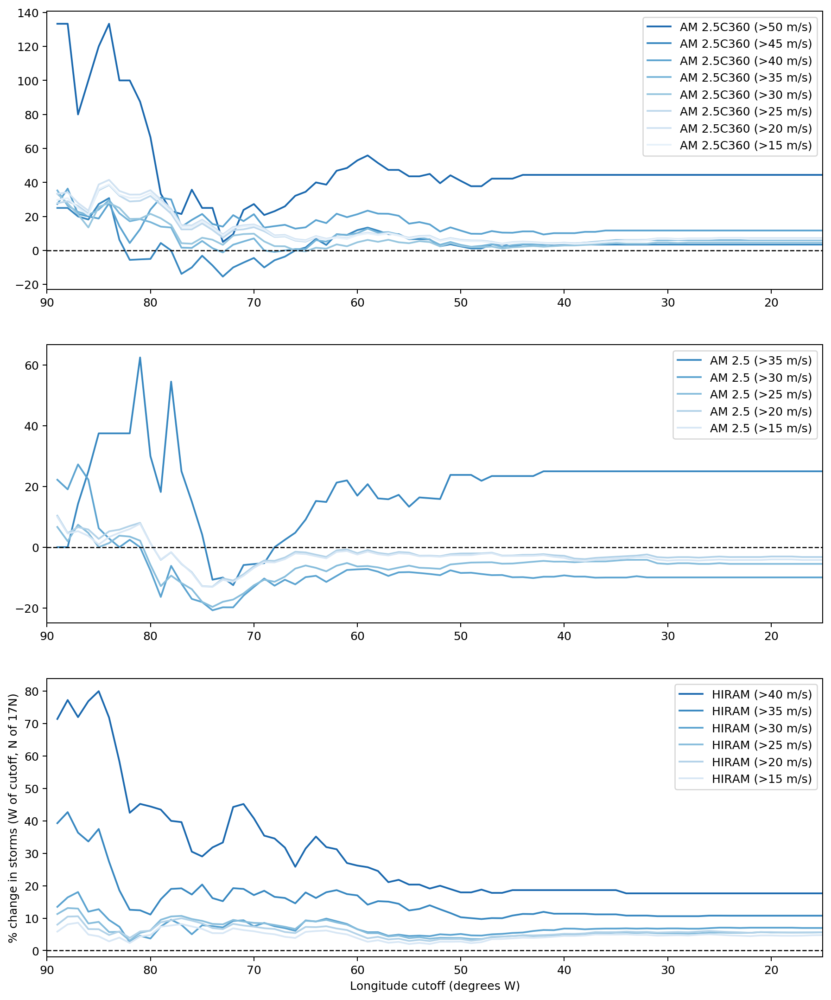

In [462]:
import matplotlib as mpl

lon_cutoffs_plot = list(reversed(range(15,90)))


plt.subplots(3,1,figsize=(12,15))

ax1=plt.subplot(3,1,1)
ax1.plot(lon_cutoffs_plot,storms_per_AM25C360_50ms, label='AM 2.5C360 (>50 m/s)',c=mpl.cm.Blues(200))
ax1.plot(lon_cutoffs_plot,storms_per_AM25C360_45ms, label='AM 2.5C360 (>45 m/s)',c=mpl.cm.Blues(170))
ax1.plot(lon_cutoffs_plot,storms_per_AM25C360_40ms, label='AM 2.5C360 (>40 m/s)',c=mpl.cm.Blues(140))
ax1.plot(lon_cutoffs_plot,storms_per_AM25C360_35ms, label='AM 2.5C360 (>35 m/s)',c=mpl.cm.Blues(120))
ax1.plot(lon_cutoffs_plot,storms_per_AM25C360_30ms, label='AM 2.5C360 (>30 m/s)',c=mpl.cm.Blues(100))
ax1.plot(lon_cutoffs_plot,storms_per_AM25C360_25ms, label='AM 2.5C360 (>25 m/s)',c=mpl.cm.Blues(70))
ax1.plot(lon_cutoffs_plot,storms_per_AM25C360_20ms, label='AM 2.5C360 (>20 m/s)',c=mpl.cm.Blues(50))
#ax1.plot(lon_cutoffs_plot,storms_per_AM25C360, label='AM 2.5C360 (>17 m/s)',c='#0000FF')
ax1.plot(lon_cutoffs_plot,storms_per_AM25C360_15ms, label='AM 2.5C360 (>15 m/s)',c=mpl.cm.Blues(20))
#ax1.plot(lon_cutoffs_plot,storms_per_AM25C360_13ms, label='AM 2.5C360 (>13 m/s)',c='#AAAAFF')
ax1.axhline(y=0,linestyle='--',color='k',lw=1)
ax1.set_xlim(90,15)
ax1.legend(loc=1)

ax2=plt.subplot(3,1,3)
ax2.plot(lon_cutoffs_plot,storms_per_HIRAM_40ms,label='HIRAM (>40 m/s)',c=mpl.cm.Blues(200))

ax2.plot(lon_cutoffs_plot,storms_per_HIRAM_35ms,label='HIRAM (>35 m/s)',c=mpl.cm.Blues(170))

ax2.plot(lon_cutoffs_plot,storms_per_HIRAM_30ms,label='HIRAM (>30 m/s)',c=mpl.cm.Blues(140))
ax2.plot(lon_cutoffs_plot,storms_per_HIRAM_25ms,label='HIRAM (>25 m/s)',c=mpl.cm.Blues(110))
ax2.plot(lon_cutoffs_plot,storms_per_HIRAM_20ms,label='HIRAM (>20 m/s)',c=mpl.cm.Blues(80))
#plt.plot(lon_cutoffs_plot,storms_per_HIRAM,label='HIRAM (>17 m/s)',c='#FF0000')
ax2.plot(lon_cutoffs_plot,storms_per_HIRAM_15ms,label='HIRAM (>15 m/s)',c=mpl.cm.Blues(40))
#plt.plot(lon_cutoffs_plot,storms_per_HIRAM_13ms,label='HIRAM (>13 m/s)',c='#FFAAAA')
ax2.axhline(y=0,linestyle='--',color='k',lw=1)
ax2.set_xlim(90,15)
ax2.legend(loc=1)
ax2.set_ylabel('% change in storms (W of cutoff, N of 17N)')
ax2.set_xlabel('Longitude cutoff (degrees W)')

ax3=plt.subplot(3,1,2)
ax3.plot(lon_cutoffs_plot,storms_per_AM25_35ms,label='AM 2.5 (>35 m/s)',c=mpl.cm.Blues(170))
ax3.plot(lon_cutoffs_plot,storms_per_AM25_30ms,label='AM 2.5 (>30 m/s)',c=mpl.cm.Blues(140))
ax3.plot(lon_cutoffs_plot,storms_per_AM25_25ms,label='AM 2.5 (>25 m/s)',c=mpl.cm.Blues(110))
ax3.plot(lon_cutoffs_plot,storms_per_AM25_20ms,label='AM 2.5 (>20 m/s)',c=mpl.cm.Blues(80))
#plt.plot(lon_cutoffs_plot,storms_per_AM25_17ms,label='AM 2.5 (>17 m/s)',c='#00FF00')
ax3.plot(lon_cutoffs_plot,storms_per_AM25,label='AM 2.5 (>15 m/s)',c=mpl.cm.Blues(40))
#plt.plot(lon_cutoffs_plot,storms_per_AM25_13ms,label='AM 2.5 (>13 m/s)',c='#AAFFAA')
ax3.axhline(y=0,linestyle='--',color='k',lw=1)
ax3.set_xlim(90,15)

ax3.legend(loc=1)
#plt.savefig('per_change_lon_cutoff_HIRAM_AM25_C360.png')

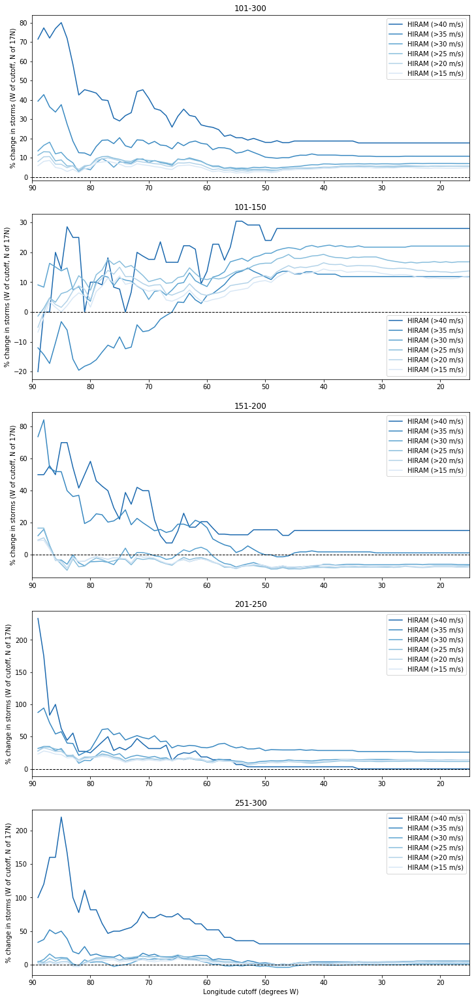

In [120]:
import matplotlib as mpl

lon_cutoffs_plot = list(reversed(range(15,90)))


plt.subplots(5,1,figsize=(12,27))

ax1=plt.subplot(5,1,1)
ax1.plot(lon_cutoffs_plot,storms_per_HIRAM_40ms,label='HIRAM (>40 m/s)',c=mpl.cm.Blues(200))
ax1.plot(lon_cutoffs_plot,storms_per_HIRAM_35ms,label='HIRAM (>35 m/s)',c=mpl.cm.Blues(170))
ax1.plot(lon_cutoffs_plot,storms_per_HIRAM_30ms,label='HIRAM (>30 m/s)',c=mpl.cm.Blues(140))
ax1.plot(lon_cutoffs_plot,storms_per_HIRAM_25ms,label='HIRAM (>25 m/s)',c=mpl.cm.Blues(110))
ax1.plot(lon_cutoffs_plot,storms_per_HIRAM_20ms,label='HIRAM (>20 m/s)',c=mpl.cm.Blues(80))
ax1.plot(lon_cutoffs_plot,storms_per_HIRAM_15ms,label='HIRAM (>15 m/s)',c=mpl.cm.Blues(40))
ax1.axhline(y=0,linestyle='--',color='k',lw=1)
ax1.set_xlim(90,15)
ax1.legend(loc=1)
ax1.set_ylabel('% change in storms (W of cutoff, N of 17N)')
#ax1.set_xlabel('Longitude cutoff (degrees W)')
ax1.set_title('101-300')

ax2=plt.subplot(5,1,2)
ax2.plot(lon_cutoffs_plot,storms_per_HIRAM_40ms_101_151,label='HIRAM (>40 m/s)',c=mpl.cm.Blues(200))
ax2.plot(lon_cutoffs_plot,storms_per_HIRAM_35ms_101_151,label='HIRAM (>35 m/s)',c=mpl.cm.Blues(170))
ax2.plot(lon_cutoffs_plot,storms_per_HIRAM_30ms_101_151,label='HIRAM (>30 m/s)',c=mpl.cm.Blues(140))
ax2.plot(lon_cutoffs_plot,storms_per_HIRAM_25ms_101_151,label='HIRAM (>25 m/s)',c=mpl.cm.Blues(110))
ax2.plot(lon_cutoffs_plot,storms_per_HIRAM_20ms_101_151,label='HIRAM (>20 m/s)',c=mpl.cm.Blues(80))
ax2.plot(lon_cutoffs_plot,storms_per_HIRAM_15ms_101_151,label='HIRAM (>15 m/s)',c=mpl.cm.Blues(40))
ax2.axhline(y=0,linestyle='--',color='k',lw=1)
ax2.set_xlim(90,15)
ax2.legend(loc=4)
ax2.set_ylabel('% change in storms (W of cutoff, N of 17N)')
#ax2.set_xlabel('Longitude cutoff (degrees W)')
ax2.set_title('101-150')

ax3=plt.subplot(5,1,3)
ax3.plot(lon_cutoffs_plot,storms_per_HIRAM_40ms_151_201,label='HIRAM (>40 m/s)',c=mpl.cm.Blues(200))
ax3.plot(lon_cutoffs_plot,storms_per_HIRAM_35ms_151_201,label='HIRAM (>35 m/s)',c=mpl.cm.Blues(170))
ax3.plot(lon_cutoffs_plot,storms_per_HIRAM_30ms_151_201,label='HIRAM (>30 m/s)',c=mpl.cm.Blues(140))
ax3.plot(lon_cutoffs_plot,storms_per_HIRAM_25ms_151_201,label='HIRAM (>25 m/s)',c=mpl.cm.Blues(110))
ax3.plot(lon_cutoffs_plot,storms_per_HIRAM_20ms_151_201,label='HIRAM (>20 m/s)',c=mpl.cm.Blues(80))
ax3.plot(lon_cutoffs_plot,storms_per_HIRAM_15ms_151_201,label='HIRAM (>15 m/s)',c=mpl.cm.Blues(40))
ax3.axhline(y=0,linestyle='--',color='k',lw=1)
ax3.set_xlim(90,15)
ax3.legend(loc=1)
ax3.set_ylabel('% change in storms (W of cutoff, N of 17N)')
#ax3.set_xlabel('Longitude cutoff (degrees W)')
ax3.set_title('151-200')

ax4=plt.subplot(5,1,4)
ax4.plot(lon_cutoffs_plot,storms_per_HIRAM_40ms_201_251,label='HIRAM (>40 m/s)',c=mpl.cm.Blues(200))
ax4.plot(lon_cutoffs_plot,storms_per_HIRAM_35ms_201_251,label='HIRAM (>35 m/s)',c=mpl.cm.Blues(170))
ax4.plot(lon_cutoffs_plot,storms_per_HIRAM_30ms_201_251,label='HIRAM (>30 m/s)',c=mpl.cm.Blues(140))
ax4.plot(lon_cutoffs_plot,storms_per_HIRAM_25ms_201_251,label='HIRAM (>25 m/s)',c=mpl.cm.Blues(110))
ax4.plot(lon_cutoffs_plot,storms_per_HIRAM_20ms_201_251,label='HIRAM (>20 m/s)',c=mpl.cm.Blues(80))
ax4.plot(lon_cutoffs_plot,storms_per_HIRAM_15ms_201_251,label='HIRAM (>15 m/s)',c=mpl.cm.Blues(40))
ax4.axhline(y=0,linestyle='--',color='k',lw=1)
ax4.set_xlim(90,15)
ax4.legend(loc=1)
ax4.set_ylabel('% change in storms (W of cutoff, N of 17N)')
#ax4.set_xlabel('Longitude cutoff (degrees W)')
ax4.set_title('201-250')

ax5=plt.subplot(5,1,5)
ax5.plot(lon_cutoffs_plot,storms_per_HIRAM_40ms_251_301,label='HIRAM (>40 m/s)',c=mpl.cm.Blues(200))
ax5.plot(lon_cutoffs_plot,storms_per_HIRAM_35ms_251_301,label='HIRAM (>35 m/s)',c=mpl.cm.Blues(170))
ax5.plot(lon_cutoffs_plot,storms_per_HIRAM_30ms_251_301,label='HIRAM (>30 m/s)',c=mpl.cm.Blues(140))
ax5.plot(lon_cutoffs_plot,storms_per_HIRAM_25ms_251_301,label='HIRAM (>25 m/s)',c=mpl.cm.Blues(110))
ax5.plot(lon_cutoffs_plot,storms_per_HIRAM_20ms_251_301,label='HIRAM (>20 m/s)',c=mpl.cm.Blues(80))
ax5.plot(lon_cutoffs_plot,storms_per_HIRAM_15ms_251_301,label='HIRAM (>15 m/s)',c=mpl.cm.Blues(40))
ax5.axhline(y=0,linestyle='--',color='k',lw=1)
ax5.set_xlim(90,15)
ax5.legend(loc=1)
ax5.set_ylabel('% change in storms (W of cutoff, N of 17N)')
ax5.set_xlabel('Longitude cutoff (degrees W)')
ax5.set_title('251-300')

#plt.savefig('per_change_lon_cutoff_HIRAM_50yrs.png')

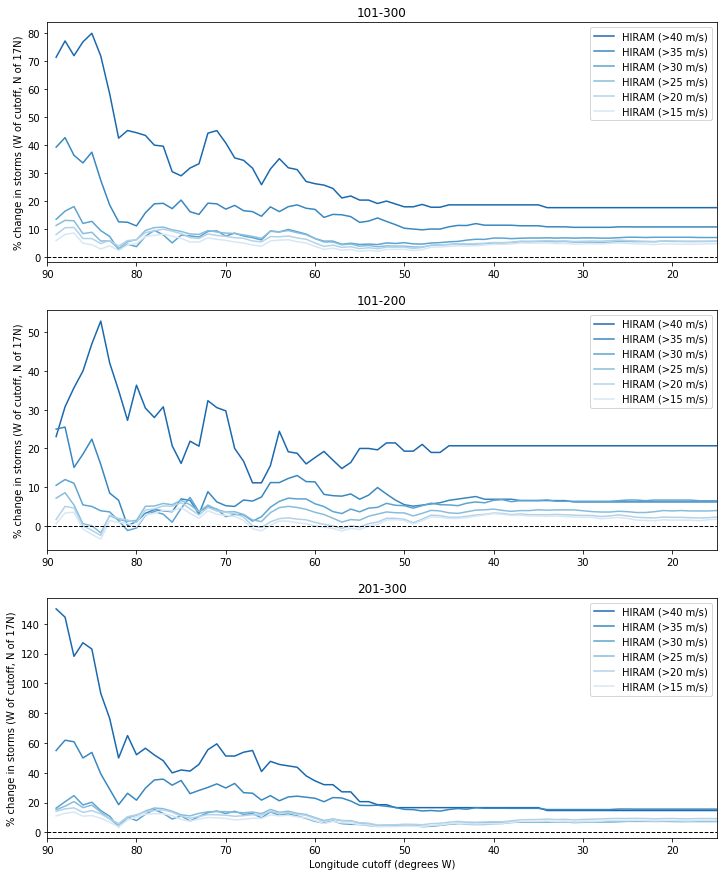

In [123]:
import matplotlib as mpl

lon_cutoffs_plot = list(reversed(range(15,90)))


plt.subplots(3,1,figsize=(12,15))

ax1=plt.subplot(3,1,1)
ax1.plot(lon_cutoffs_plot,storms_per_HIRAM_40ms,label='HIRAM (>40 m/s)',c=mpl.cm.Blues(200))
ax1.plot(lon_cutoffs_plot,storms_per_HIRAM_35ms,label='HIRAM (>35 m/s)',c=mpl.cm.Blues(170))
ax1.plot(lon_cutoffs_plot,storms_per_HIRAM_30ms,label='HIRAM (>30 m/s)',c=mpl.cm.Blues(140))
ax1.plot(lon_cutoffs_plot,storms_per_HIRAM_25ms,label='HIRAM (>25 m/s)',c=mpl.cm.Blues(110))
ax1.plot(lon_cutoffs_plot,storms_per_HIRAM_20ms,label='HIRAM (>20 m/s)',c=mpl.cm.Blues(80))
ax1.plot(lon_cutoffs_plot,storms_per_HIRAM_15ms,label='HIRAM (>15 m/s)',c=mpl.cm.Blues(40))
ax1.axhline(y=0,linestyle='--',color='k',lw=1)
ax1.set_xlim(90,15)
ax1.legend(loc=1)
ax1.set_ylabel('% change in storms (W of cutoff, N of 17N)')
#ax1.set_xlabel('Longitude cutoff (degrees W)')
ax1.set_title('101-300')

ax2=plt.subplot(3,1,2)
ax2.plot(lon_cutoffs_plot,storms_per_HIRAM_40ms_101_201,label='HIRAM (>40 m/s)',c=mpl.cm.Blues(200))
ax2.plot(lon_cutoffs_plot,storms_per_HIRAM_35ms_101_201,label='HIRAM (>35 m/s)',c=mpl.cm.Blues(170))
ax2.plot(lon_cutoffs_plot,storms_per_HIRAM_30ms_101_201,label='HIRAM (>30 m/s)',c=mpl.cm.Blues(140))
ax2.plot(lon_cutoffs_plot,storms_per_HIRAM_25ms_101_201,label='HIRAM (>25 m/s)',c=mpl.cm.Blues(110))
ax2.plot(lon_cutoffs_plot,storms_per_HIRAM_20ms_101_201,label='HIRAM (>20 m/s)',c=mpl.cm.Blues(80))
ax2.plot(lon_cutoffs_plot,storms_per_HIRAM_15ms_101_201,label='HIRAM (>15 m/s)',c=mpl.cm.Blues(40))
ax2.axhline(y=0,linestyle='--',color='k',lw=1)
ax2.set_xlim(90,15)
ax2.legend(loc=1)
ax2.set_ylabel('% change in storms (W of cutoff, N of 17N)')
#ax2.set_xlabel('Longitude cutoff (degrees W)')
ax2.set_title('101-200')

ax3=plt.subplot(3,1,3)
ax3.plot(lon_cutoffs_plot,storms_per_HIRAM_40ms_201_301,label='HIRAM (>40 m/s)',c=mpl.cm.Blues(200))
ax3.plot(lon_cutoffs_plot,storms_per_HIRAM_35ms_201_301,label='HIRAM (>35 m/s)',c=mpl.cm.Blues(170))
ax3.plot(lon_cutoffs_plot,storms_per_HIRAM_30ms_201_301,label='HIRAM (>30 m/s)',c=mpl.cm.Blues(140))
ax3.plot(lon_cutoffs_plot,storms_per_HIRAM_25ms_201_301,label='HIRAM (>25 m/s)',c=mpl.cm.Blues(110))
ax3.plot(lon_cutoffs_plot,storms_per_HIRAM_20ms_201_301,label='HIRAM (>20 m/s)',c=mpl.cm.Blues(80))
ax3.plot(lon_cutoffs_plot,storms_per_HIRAM_15ms_201_301,label='HIRAM (>15 m/s)',c=mpl.cm.Blues(40))
ax3.axhline(y=0,linestyle='--',color='k',lw=1)
ax3.set_xlim(90,15)
ax3.legend(loc=1)
ax3.set_ylabel('% change in storms (W of cutoff, N of 17N)')
ax3.set_xlabel('Longitude cutoff (degrees W)')
ax3.set_title('201-300')


#plt.savefig('per_change_lon_cutoff_HIRAM_100yrs.png')

In [302]:
storms_per_AM25C360_15ms[5]-storms_per_AM25C360_20ms[5]

-2.6205450733752684

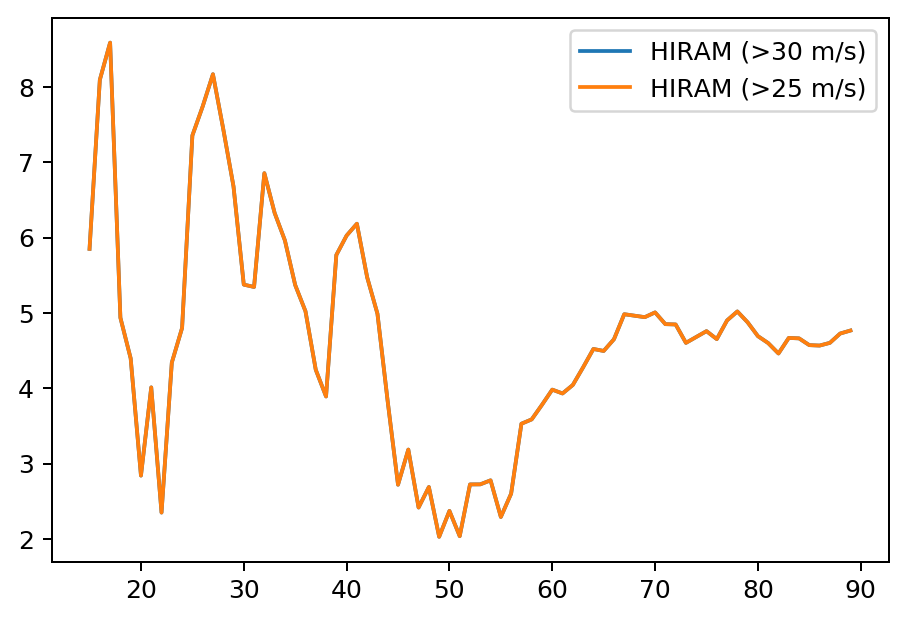

In [423]:
plt.plot(lon_cutoffs_plot,storms_per_HIRAM_30ms,label='HIRAM (>30 m/s)')
plt.plot(lon_cutoffs_plot,storms_per_HIRAM_15ms,label='HIRAM (>25 m/s)')
plt.legend()


In [100]:
for i in range(len(storms_per_HIRAM_20ms)):
    if (storms_per_HIRAM_30ms[i] - storms_per_HIRAM_15ms[i] !=0):
        print('not the same')


not the same
not the same
not the same
not the same
not the same
not the same
not the same
not the same
not the same
not the same
not the same
not the same
not the same
not the same
not the same
not the same
not the same
not the same
not the same
not the same
not the same
not the same
not the same
not the same
not the same
not the same
not the same
not the same
not the same
not the same
not the same
not the same
not the same
not the same
not the same
not the same
not the same
not the same
not the same
not the same
not the same
not the same
not the same
not the same
not the same
not the same
not the same
not the same
not the same
not the same
not the same
not the same
not the same
not the same
not the same
not the same
not the same
not the same
not the same
not the same
not the same
not the same
not the same
not the same
not the same
not the same
not the same
not the same
not the same
not the same
not the same
not the same
not the same
not the same
not the same


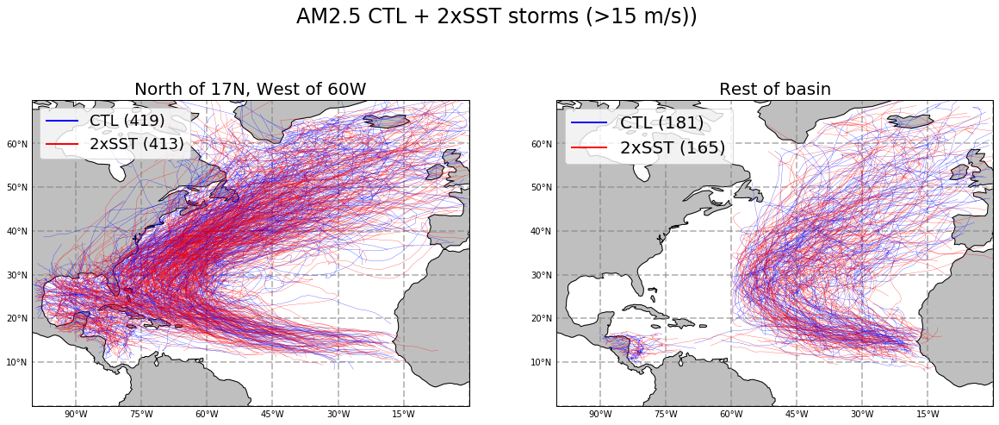

In [208]:
#exp=model_used
fig, axes = plt.subplots(1, 2, figsize=(20,10))
titles = ['North of 17N, West of 60W','Rest of basin']
for ii, ax in enumerate(axes.flat):
    n=1
    ax=plt.subplot(1,2,ii+1,projection=ccrs.PlateCarree())
    ax.set_extent([-100, 0, 0, 70], ccrs.PlateCarree())

    for index, row in e_w[ii].iterrows():
            if e_w[ii].Count[index]>n:
                n = e_w[ii].Count[index]
            if e_w[ii].Count[index]==n:
            #single_hur = e_w[ii][e_w[ii].Count==n]
                g = e_w[ii].Genesis[index]
                l = e_w[ii].Lysis[index]
                if e_w[ii].Experiment[index]=='CTL':
                    plt.plot(lons[index][g:l+1],lats[index][g:l+1],color='b',transform=ccrs.PlateCarree(),lw=.25)
                else:
                    plt.plot(lons[index][g:l+1],lats[index][g:l+1],color='r',transform=ccrs.PlateCarree(),lw=.25)

                n += 1
    plt.title(titles[ii],fontsize=20)
    gl=ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=2, color='gray', alpha=0.5, linestyle='--')
    gl.xlabels_top=False
    gl.ylabels_right=False
    gl.xformatter=LONGITUDE_FORMATTER
    gl.yformatter=LATITUDE_FORMATTER
    ax.add_feature(cfeature.LAND, facecolor='0.75')
    ax.coastlines() 
    custom_lines = [Line2D([0], [0], color='b', lw=2), Line2D([0], [0], color='r', lw=2)]
    ax.legend(custom_lines, [f'CTL (%d)'%len(e_w[ii][e_w[ii].Experiment=='CTL']), f'2xSST (%d)'%len(e_w[ii][e_w[ii].Experiment=='2X'])],fontsize=20)
    if ii==0:
            custom_lines = [Line2D([0], [0], color='b', lw=2), Line2D([0], [0], color='r', lw=2)]
            ax.legend(custom_lines, [f'CTL (%d)'%len(e_w[ii][e_w[ii].Experiment=='CTL']), f'2xSST (%d)'%len(e_w[ii][e_w[ii].Experiment=='2X']),'CTL', '2xSST'],fontsize=18)


plt.suptitle(f'%s CTL + 2xSST storms (>15 m/s))'%exp['model'],fontsize=24,y=.9)

plt.savefig(f'%s_ew.png'%exp['model'])




AttributeError: 'list' object has no attribute 'lat'

# Clustering

In [138]:
df_ctl_NA = xr.Dataset.to_dataframe(ds_ctl_NA)
df_2x_NA = xr.Dataset.to_dataframe(ds_2x_NA)

#exp=model_used
#v = 15.
all_storms_ds = xr.open_dataset(f'/tigress/tessj/data/%s_all_storms_15ms.nc'%(exp['model']))
all_storms_df = xr.Dataset.to_dataframe(all_storms_ds)


In [139]:
#Make a copy of DF
all_storms_df_cp = all_storms_df
k=5

#Standardize
clmns = ['Lat_gen', 'Lon_gen','Lat_lys', 'Lon_lys', 'Lat_max', 'Lon_max']
all_storms_df_cp_std = stats.zscore(all_storms_df_cp[clmns])

#Cluster the data
kmeans = KMeans(n_clusters=k, random_state=0).fit(all_storms_df_cp_std)
labels = kmeans.labels_

#Glue back to originaal data
all_storms_df_cp['clusters'] = labels

#Add the column into our list
clmns.extend(['clusters'])

all_storms_df_cp


,Count,Lat_gen,Lon_gen,Lat_lys,Lon_lys,Lat_max,Lon_max,Wind_max,Genesis,Lysis,Year,Mon,Experiment,clusters
index,,,,,,,,,,,,,,
0,1,14.79,279.16,51.80,313.50,27.79,273.04,34.45,4,62,101,5.0,CTL,2
1,2,27.14,283.96,39.62,288.72,33.77,286.39,24.15,1,20,101,6.0,CTL,2
2,3,18.13,297.81,31.69,266.95,27.78,269.49,25.10,0,24,101,8.0,CTL,0
3,4,22.62,294.08,69.30,358.35,43.73,308.72,39.64,0,43,101,8.0,CTL,3
4,5,10.41,319.21,46.81,299.54,29.55,279.53,35.88,0,62,101,8.0,CTL,1
5,6,31.55,283.44,43.73,289.09,34.83,287.87,20.81,3,42,101,8.0,CTL,2
6,7,28.21,307.76,50.53,323.97,36.85,313.19,30.69,6,91,101,9.0,CTL,3
7,8,14.74,339.28,57.96,356.18,46.28,306.48,28.50,6,60,101,9.0,CTL,1
8,9,27.71,291.36,45.32,313.21,29.87,291.05,21.33,3,39,101,9.0,CTL,2


In [140]:
centers = all_storms_df_cp[clmns].groupby(['clusters']).mean()
centers_ctl = all_storms_df_cp[all_storms_df_cp['Experiment']=='CTL'][clmns].groupby(['clusters']).mean()
centers_2x = all_storms_df_cp[all_storms_df_cp['Experiment']=='2X'][clmns].groupby(['clusters']).mean()
centers_2x

,Lat_gen,Lon_gen,Lat_lys,Lon_lys,Lat_max,Lon_max
clusters,,,,,,
0,17.267778,288.075968,27.623333,272.003297,22.807240,274.159032
1,14.182433,327.368957,53.681163,336.072366,33.797848,306.315722
2,22.561472,289.486933,50.183047,312.354949,33.092740,288.582781
3,29.537127,304.011157,52.206474,337.144216,41.591567,315.732519
4,12.107826,334.909845,22.864596,317.987050,15.315404,326.014255


In [141]:
#separate clusters into their own dataframes
clusters = []
for i in range(k):
    clusters.append(all_storms_df[all_storms_df.clusters==i])

Text(0.5, 0.85, 'HIRAM CTL + 2xSST storm clusters')

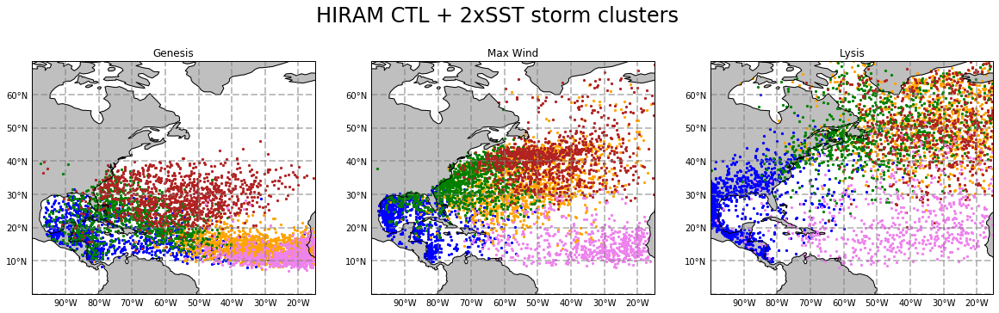

In [142]:
fig, axes = plt.subplots(1, 3, figsize=(20,8))
titles = ['Genesis','Max Wind', 'Lysis']
colors = ['b','orange','g','firebrick','violet']
varnames = [['Lon_gen','Lat_gen'],['Lon_max','Lat_max'],['Lon_lys','Lat_lys']]

for ii, ax in enumerate(axes.flat):
    ax=plt.subplot(1,3,ii+1,projection=ccrs.PlateCarree())
    ax.set_extent([-100, -15, 0, 70], ccrs.PlateCarree())
    for i in range(len(clusters)):
        plt.scatter(clusters[i][varnames[ii][0]],clusters[i][varnames[ii][1]],color=colors[i],s=5,transform=ccrs.PlateCarree())
    plt.title(titles[ii])
    gl=ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=2, color='gray', alpha=0.5, linestyle='--')
    gl.xlabels_top=False
    gl.ylabels_right=False
    gl.xformatter=LONGITUDE_FORMATTER
    gl.yformatter=LATITUDE_FORMATTER
    ax.add_feature(cfeature.LAND, facecolor='0.75')
    ax.coastlines() 

plt.suptitle(f'%s CTL + 2xSST storm clusters'%exp['model'],fontsize=24,y=.85)


In [143]:
clusters

[       Count  Lat_gen  Lon_gen  Lat_lys  Lon_lys  Lat_max  Lon_max  Wind_max  \
 index                                                                          
 2          3    18.13   297.81    31.69   266.95    27.78   269.49     25.10   
 10        11    11.33   305.64    24.36   262.78    17.22   273.55     21.05   
 17        18    15.22   287.72    29.95   275.28    21.03   275.51     37.44   
 20        21    17.27   273.37    26.05   260.70    25.35   264.04     31.07   
 22        23    20.71   295.78    26.13   260.94    24.85   264.90     36.46   
 23        24    14.30   302.77    26.59   260.19    22.77   269.51     43.85   
 26        27    15.25   334.57    35.96   275.14    25.64   280.20     42.48   
 31        32    16.77   274.07    29.26   276.11    18.95   272.81     30.92   
 32        33    17.98   269.22    17.98   269.22    17.98   269.22       NaN   
 33        34    16.80   312.26    29.15   260.77    27.73   265.08     28.91   
 39        40    14.70   304

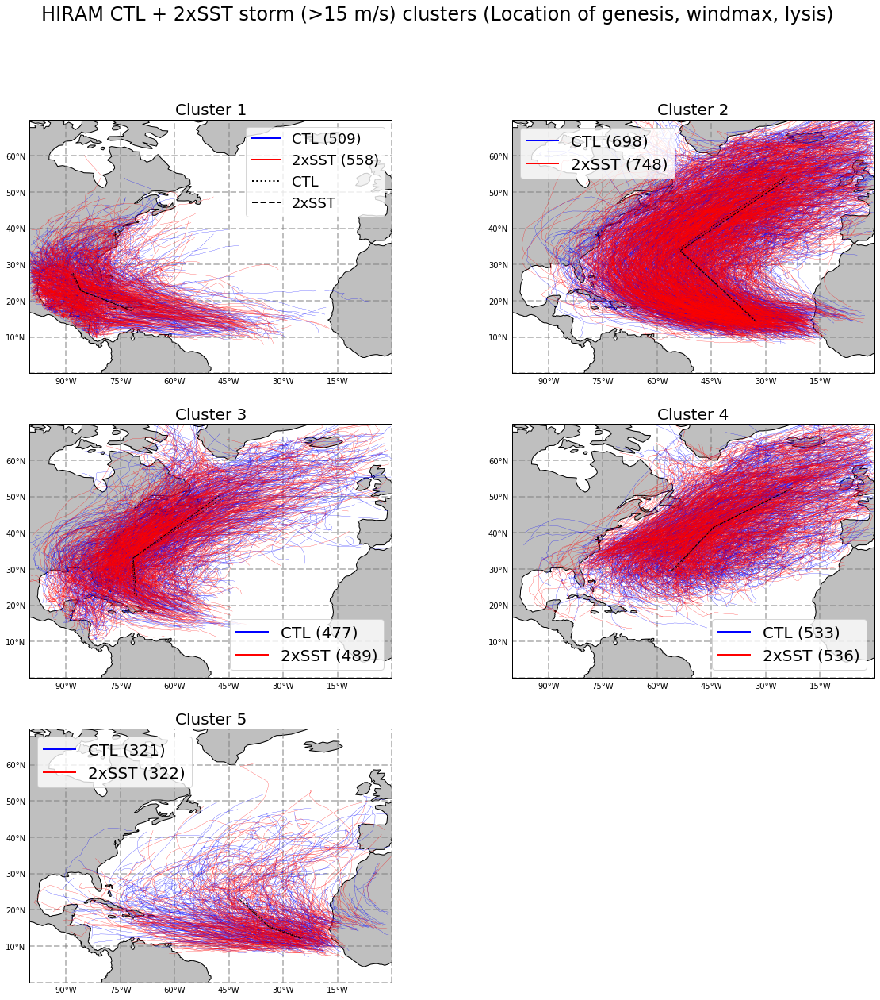

In [145]:
#exp=model_used
fig, axes = plt.subplots(3, 2, figsize=(20,20))
titles = ['Cluster 1','Cluster 2','Cluster 3','Cluster 4','Cluster 5']
for ii, ax in enumerate(axes.flat):
    if ii==5:
        break
    n=1
    ax=plt.subplot(3,2,ii+1,projection=ccrs.PlateCarree())
    ax.set_extent([-100, 0, 0, 70], ccrs.PlateCarree())
    for index, row in clusters[ii].iterrows():
        if clusters[ii].Count[index]>n:
            n = clusters[ii].Count[index]
        if clusters[ii].Count[index]==n:
            #single_hur = clusters[ii][clusters[ii].Count==n]
            g = clusters[ii].Genesis[index]
            l = clusters[ii].Lysis[index]
            if clusters[ii].Experiment[index]=='CTL':
                plt.plot(lons[index][g:l+1],lats[index][g:l+1],color='b',transform=ccrs.PlateCarree(),lw=.25)
            else:
                plt.plot(lons[index][g:l+1],lats[index][g:l+1],color='r',transform=ccrs.PlateCarree(),lw=.25)

            n += 1
   # x, y = [centers.Lon_gen[ii], centers.Lon_max[ii], centers.Lon_lys[ii]], [centers.Lat_gen[ii], centers.Lat_max[ii], centers.Lat_lys[ii]]
   # plt.plot(x, y, transform=ccrs.PlateCarree(),color='k',linewidth=1)
    x, y = [centers_ctl.Lon_gen[ii], centers_ctl.Lon_max[ii], centers_ctl.Lon_lys[ii]], [centers_ctl.Lat_gen[ii], centers_ctl.Lat_max[ii], centers_ctl.Lat_lys[ii]]
    plt.plot(x, y, transform=ccrs.PlateCarree(),color='k',linewidth=1,linestyle=':')
    x, y = [centers_2x.Lon_gen[ii], centers_2x.Lon_max[ii], centers_2x.Lon_lys[ii]], [centers_2x.Lat_gen[ii], centers_2x.Lat_max[ii], centers_2x.Lat_lys[ii]]
    plt.plot(x, y, transform=ccrs.PlateCarree(),color='k',linewidth=1,linestyle='--')
    plt.title(titles[ii],fontsize=20)
    gl=ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=2, color='gray', alpha=0.5, linestyle='--')
    gl.xlabels_top=False
    gl.ylabels_right=False
    gl.xformatter=LONGITUDE_FORMATTER
    gl.yformatter=LATITUDE_FORMATTER
    ax.add_feature(cfeature.LAND, facecolor='0.75')
    ax.coastlines() 
    custom_lines = [Line2D([0], [0], color='b', lw=2), Line2D([0], [0], color='r', lw=2)]
    ax.legend(custom_lines, [f'CTL (%d)'%len(clusters[ii][clusters[ii].Experiment=='CTL']), f'2xSST (%d)'%len(clusters[ii][clusters[ii].Experiment=='2X'])],fontsize=20)
    if ii==0:
            custom_lines = [Line2D([0], [0], color='b', lw=2), Line2D([0], [0], color='r', lw=2),Line2D([0], [0], color='k', lw=2,linestyle=':'), Line2D([0], [0], color='k', lw=2,linestyle='--')]
            ax.legend(custom_lines, [f'CTL (%d)'%len(clusters[ii][clusters[ii].Experiment=='CTL']), f'2xSST (%d)'%len(clusters[ii][clusters[ii].Experiment=='2X']),'CTL', '2xSST'],fontsize=18)

fig.delaxes(ax= axes[2,1])

plt.suptitle(f'%s CTL + 2xSST storm (>15 m/s) clusters (Location of genesis, windmax, lysis)'%exp['model'],fontsize=24)

plt.savefig(f'%s_5clusters_15ms.png'%exp['model'])

In [144]:
#quick histogram
#all_storms_df_cp[all_storms_df_cp.Experiment == 'CTL'].Year.hist(bins=100)


In [27]:
# change in storms per year for each cluster?
for ii in range(k):
    change=[]
    for i in range(101,201):
        change.append(Counter(all_storms_df_cp[all_storms_df_cp.Experiment == '2X'][all_storms_df_cp.clusters == ii].Year)[i] - Counter(all_storms_df_cp[all_storms_df_cp.Experiment == 'CTL'][all_storms_df_cp.clusters == ii].Year)[i])
    print(f'Avg change in TS in cluster %i per year = %f'%(ii+1,np.mean(change)))
    
change = []
for i in range(101,201):
    change.append(Counter(all_storms_df_cp[all_storms_df_cp.Experiment == '2X'].Year)[i] - Counter(all_storms_df_cp[all_storms_df_cp.Experiment == 'CTL'].Year)[i])
    
print(f'Avg change in all TS per year = %f'%np.mean(change))


/home/tessj/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """


Avg change in TS in cluster 1 per year = -0.010000
Avg change in TS in cluster 2 per year = 0.570000
Avg change in TS in cluster 3 per year = -0.230000
Avg change in TS in cluster 4 per year = -0.190000
Avg change in TS in cluster 5 per year = 0.130000
Avg change in all TS per year = 0.270000


# HURDAT2 clusters

In [64]:
hurdat=xr.open_dataset('/tigress/tessj/data/hurdat2_atlantic.nc')
# keep entries w/ wind >= 33kts
hurdat=xr.Dataset.to_dataframe(hurdat)
for i in range(int(max(hurdat.Count))):
    if (len(hurdat[hurdat.Count==i])<8):
        hurdat=hurdat[hurdat.Count!=i]
hurdat_cluster=hurdat[hurdat.Wind >= 33]
# create datetime column
time = []
for year, month, day, hour, minute, long in zip(hurdat_cluster.Year.values, hurdat_cluster.Month.values, hurdat_cluster.Day.values, hurdat_cluster.Hour.values, hurdat_cluster.Minute.values, hurdat_cluster.Longitude.values):
    year = str(int(year))
    month = str(int(month)).zfill(2)
    day = str(int(day)).zfill(2)
    hour = str(int(hour)).zfill(2)
    minute = str(int(minute)).zfill(2)
    dt = datetime.strptime(year+month+day+hour+minute,'%Y%m%d%H%M')
    time.append(dt)
index = hurdat_cluster.index
time = xr.DataArray(time, coords=[index], dims=['index'])
hurdat_cluster=hurdat_cluster.to_xarray()
hurdat_cluster = xr.merge([hurdat_cluster,xr.DataArray(time, name='Time')])
hurdat_cluster=xr.Dataset.to_dataframe(hurdat_cluster)


In [65]:
hurdat_cluster = hurdat_cluster.rename(columns={'Latitude': 'Latitude_Gen', 'Longitude': 'Longitude_Gen'})
# make dataset with storm count, genesis lat/long, lysis lat/long, max wind lat/long, max wind value
count = []
lat_gen = []
long_gen = []
lat_lys = []
long_lys = []
lat_max = []
long_max = []
wind_max=[]
year = []
n = 1
hurdat_cluster = hurdat_cluster.reset_index(drop=True)
for index, row in hurdat_cluster.iterrows():
    if hurdat_cluster.Count[index]==n:
        hurdat_single = hurdat_cluster[hurdat_cluster.Count==n]
        count.append(hurdat_single.Count.iat[0])
        lat_gen.append(hurdat_single.Latitude_Gen.iat[0])
        long_gen.append(hurdat_single.Longitude_Gen.iat[0])
        lat_lys.append(hurdat_single.Latitude_Gen.iat[-1])
        long_lys.append(hurdat_single.Longitude_Gen.iat[-1])
        i = hurdat_single['Wind'].idxmax()
        wind_max.append(hurdat_cluster.Wind.iat[i])
        lat_max.append(hurdat_cluster.Latitude_Gen.iat[i])
        long_max.append(hurdat_cluster.Longitude_Gen.iat[i])
        year.append(hurdat_single.Year.iat[0])
        n += 1
    if not (n in hurdat_cluster.Count.values):
        n += 1
index = list(range(0,len(count)))
Count = xr.DataArray(count, coords=[index], dims=['index'])
Lat_gen = xr.DataArray(lat_gen, coords=[index], dims=['index'])
Long_gen = xr.DataArray(long_gen, coords=[index], dims=['index'])
Lat_lys = xr.DataArray(lat_lys, coords=[index], dims=['index'])
Long_lys = xr.DataArray(long_lys, coords=[index], dims=['index'])
Lat_max = xr.DataArray(lat_max, coords=[index], dims=['index'])
Long_max = xr.DataArray(long_max, coords=[index], dims=['index'])
Wind_max = xr.DataArray(wind_max, coords=[index], dims=['index'])
Year = xr.DataArray(year, coords=[index], dims=['index'])

hurdat_storms = xr.merge([xr.DataArray(Count, name='Count'), xr.DataArray(Lat_gen, name='Lat_gen'), 
                          xr.DataArray(Long_gen, name='Long_gen'), xr.DataArray(Lat_lys, name='Lat_lys'), 
                          xr.DataArray(Long_lys, name='Long_lys'), xr.DataArray(Lat_max, name='Lat_max'),
                         xr.DataArray(Long_max, name='Long_max'),xr.DataArray(Wind_max, name='Wind_max'),xr.DataArray(Year, name='Year')])
                          
hurdat_storms = xr.Dataset.to_dataframe(hurdat_storms)

                          

In [48]:
hurdat_storms

,Count,Lat_gen,Long_gen,Lat_lys,Long_lys,Lat_max,Long_max,Wind_max,Year
index,,,,,,,,,
0,1.0,28.0,-94.8,31.0,-100.2,28.0,-94.8,80.0,1851.0
1,4.0,13.4,-48.0,48.5,-54.2,27.4,-86.5,100.0,1851.0
2,5.0,32.5,-73.5,32.5,-73.5,32.5,-73.5,50.0,1851.0
3,6.0,28.7,-78.0,42.0,-71.6,30.7,-76.6,60.0,1851.0
4,7.0,20.5,-67.1,41.0,-68.0,26.7,-86.0,100.0,1852.0
5,8.0,17.0,-64.1,19.7,-72.5,17.0,-64.1,70.0,1852.0
6,9.0,26.4,-90.4,34.0,-71.5,26.4,-90.4,70.0,1852.0
7,10.0,16.1,-58.5,34.9,-68.6,19.5,-67.4,80.0,1852.0
8,11.0,17.0,-73.8,40.0,-66.0,17.0,-73.8,90.0,1852.0


In [66]:
#Make a copy of DF
hurdat_storms_tr = hurdat_storms

#Standardize
clmns = ['Lat_gen', 'Long_gen','Lat_lys', 'Long_lys', 'Lat_max', 'Long_max']
hurdat_storms_tr_std = stats.zscore(hurdat_storms_tr[clmns])

#Cluster the data
kmeans = KMeans(n_clusters=5, random_state=0).fit(hurdat_storms_tr_std)
labels = kmeans.labels_

#Glue back to originaal data
hurdat_storms_tr['clusters'] = labels

#Add the column into our list
clmns.extend(['clusters'])

In [67]:
#separate clusters into their own dataframes
clusters_hurdat = []
for i in range(5):
    clusters_hurdat.append(hurdat_storms[hurdat_storms.clusters==i])

Text(0.5, 0.85, 'HURDAT2 5 clusters')

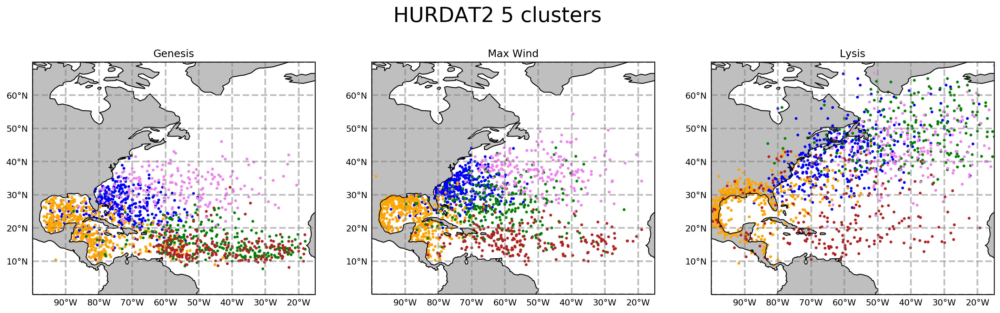

In [68]:
fig, axes = plt.subplots(1, 3, figsize=(20,8))
titles = ['Genesis','Max Wind', 'Lysis']
colors = ['b','orange','g','firebrick','violet']
varnames = [['Long_gen','Lat_gen'],['Long_max','Lat_max'],['Long_lys','Lat_lys']]

for ii, ax in enumerate(axes.flat):
    ax=plt.subplot(1,3,ii+1,projection=ccrs.PlateCarree())
    ax.set_extent([-100, -15, 0, 70], ccrs.PlateCarree())
    for i in range(len(clusters_hurdat)):
        plt.scatter(clusters_hurdat[i][varnames[ii][0]],clusters_hurdat[i][varnames[ii][1]],color=colors[i],s=5,transform=ccrs.PlateCarree())
    plt.title(titles[ii])
    gl=ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=2, color='gray', alpha=0.5, linestyle='--')
    gl.xlabels_top=False
    gl.ylabels_right=False
    gl.xformatter=LONGITUDE_FORMATTER
    gl.yformatter=LATITUDE_FORMATTER
    ax.add_feature(cfeature.LAND, facecolor='0.75')
    ax.coastlines() 

plt.suptitle('HURDAT2 5 clusters',fontsize=24,y=.85)


In [69]:
centers_hurdat = hurdat_storms_tr[clmns].groupby(['clusters']).mean()
centers_hurdat

,Lat_gen,Long_gen,Lat_lys,Long_lys,Lat_max,Long_max
clusters,,,,,,
0,26.042593,-74.147090,41.736243,-60.960582,31.392593,-73.608466
1,20.060124,-82.309091,27.617562,-88.039876,23.641116,-87.584091
2,15.849254,-45.340672,49.892537,-35.026493,26.454478,-60.867164
3,14.189823,-45.867699,23.465929,-62.788053,16.662389,-54.269912
4,32.021359,-56.314563,44.830583,-37.141748,37.129612,-50.224272


In [95]:
len(hurdat_storms)

1562

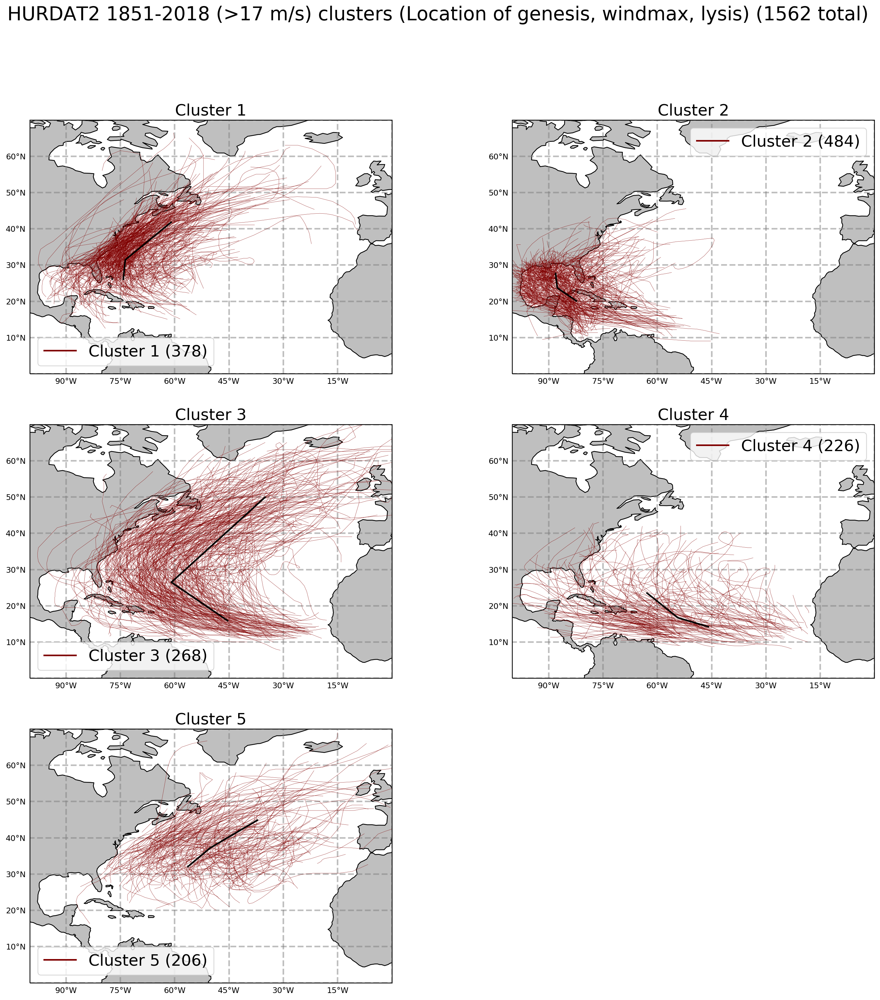

In [97]:
#exp=model_used
fig, axes = plt.subplots(3, 2, figsize=(20,20))
titles = ['Cluster 1','Cluster 2','Cluster 3','Cluster 4','Cluster 5']
for ii, ax in enumerate(axes.flat):
    if ii==5:
        break
    n=1
    ax=plt.subplot(3,2,ii+1,projection=ccrs.PlateCarree())
    ax.set_extent([-100, 0, 0, 70], ccrs.PlateCarree())
    for index, row in clusters_hurdat[ii].iterrows():
        #print(index)
        if clusters_hurdat[ii].Count[index]>n:
            #print(n)
            n = clusters_hurdat[ii].Count[index]
        if clusters_hurdat[ii].Count[index]==n:
            #single_hur = clusters_hurdat[ii][clusters_hurdat[ii].Count==n]
            #g = clusters_hurdat[ii].Genesis[index]
            #l = clusters_hurdat[ii].Lysis[index]
            #if clusters_hurdat[ii].Experiment[index]=='CTL':
            plt.plot(hurdat_cluster[hurdat_cluster.Count == n].Longitude_Gen,hurdat_cluster[hurdat_cluster.Count == n].Latitude_Gen,color='maroon',transform=ccrs.PlateCarree(),lw=.25)
                #plt.plot(lons[index][g:l+1],lats[index][g:l+1],color='b',transform=ccrs.PlateCarree(),lw=.25)
            #else:
            n += 1
    x, y = [centers_hurdat.Long_gen[ii], centers_hurdat.Long_max[ii], centers_hurdat.Long_lys[ii]], [centers_hurdat.Lat_gen[ii], centers_hurdat.Lat_max[ii], centers_hurdat.Lat_lys[ii]]
    plt.plot(x, y, transform=ccrs.PlateCarree(),color='k',linewidth=2)
    plt.title(titles[ii],fontsize=20)
    gl=ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=2, color='gray', alpha=0.5, linestyle='--')
    gl.xlabels_top=False
    gl.ylabels_right=False
    gl.xformatter=LONGITUDE_FORMATTER
    gl.yformatter=LATITUDE_FORMATTER
    ax.add_feature(cfeature.LAND, facecolor='0.75')
    ax.coastlines() 
    custom_lines = [Line2D([0], [0], color='maroon', lw=2)]
    ax.legend(custom_lines, [f'%s (%d)'%(titles[ii],len(clusters_hurdat[ii]))],fontsize=20)

fig.delaxes(ax= axes[2,1])

plt.suptitle('HURDAT2 1851-2018 (>17 m/s) clusters (Location of genesis, windmax, lysis) (1562 total)',fontsize=24)

plt.savefig('hurdat2_5clusters.png')

# 2d histogram -- having trouble !!

In [44]:
from cftime import DatetimeNoLeap
from itertools import product

def _histogram2d(lat, lon, bins, range):
    '''A variant of numpy.histogram when input is lat/lon, which has ndim of 1 or 2'''
    H, _dump1, _dump2 =  np.histogram2d(lat.ravel(),
                                        lon.ravel(),
                                        bins=bins, range=range)
    return H

def scatter_density_tess(ds, lowpass_on=True, genesis_on=True):
    '''Use numpy.histogram2d to estimate TC density or TC genesis density.

    Input: ds, TC information Dataset.
    Return: TC density DataArray.'''
    # ds = tc_get('CTL1860_noleap_tigercpu_intelmpi_18_576PE', range(11,21))
    # lowpass_on = False
    # genesis_on = True

    # lat/lon bins, centers and ranges
    lat_bins = np.arange(-90, 91, 1)
    lon_bins = np.arange(0, 361, 1)
    lat_centers = lat_bins[0:-1] + 0.5
    lon_centers = lon_bins[0:-1] + 0.5
    lat_range = (lat_bins[0], lat_bins[-1])
    lon_range = (lon_bins[0], lon_bins[-1])

    # extract data from ds
    if genesis_on:
        #ds = ds.isel(stage=0)
        input_core_dims = [['Count'],['Count']]
    #else:
        #input_core_dims = [['storm', 'stage'], ['storm', 'stage']]
    #monvec = np.arange(1, 13)
    #das = []
    #for mon in monvec:
    da = xr.apply_ufunc(_histogram2d, ds.Lat_gen, ds.Lon_gen, output_core_dims=[['lat', 'lon']], vectorize=True, kwargs={'bins': [lat_bins, lon_bins],'range': [lat_range, lon_range]})
        # da has a dims of ('year', 'lat', 'lon') or ('en', 'year', 'lat', 'lon')
    da['lat'] = lat_centers
    da['lon'] = lon_centers
    #das.append(da)
    #da = xr.concat(das, dim=pd.Index(monvec, name='mon'))
    da = da.stack(time=('Year', 'mon'))
    da['time'] = [DatetimeNoLeap(yyyy, mm, 1)]
    #    for yyyy,mm in zip(da.year.data, da.mon.data)] # da now has dims: ('lat', 'lon', 'time') or ('en', 'lat', 'lon', 'time')
    da = da.stack(z=('lat', 'lon')).unstack() # da now has dims: ('time', 'lat', 'lon') or ('en', 'time', 'lat', 'on')
    da.attrs['units'] = '# per month per 1x1deg box'
    if genesis_on:
        da.attrs['long_name'] = 'TS genesis density'
    else:
        da.attrs['long_name'] = 'TC density'

    # count in a larger lat/lon box (10 deg by 10 deg)
    if lowpass_on:
        W = 10 # rolling window size
        R = W//2 # half of the window size, or the radius
        da = xr.concat([da.isel(lon=slice(-R, None)), da, da.isel(lon=slice(0, R))], dim='lon') \
            .rolling(lon=W, center=True).sum().isel(lon=slice(R, -R)) \
            .rolling(lat=W, center=True).sum() \
            .assign_coords(lat=lat_bins[0:-1], lon=lon_bins[0:-1]) \
            .isel(lat=slice(1, None))
        if genesis_on:
            da.attrs['units'] = '# per month per 10x10deg box'
        else:
            # convert units of 6-hours to days
            da = da.pipe(lambda x: x/4).assign_attrs({'units': 'TC days per month per 10x10deg box'})

    return da

In [45]:
ts_density_ctl = scatter_density_tess(all_storms_ds.where(Experiment=='CTL',drop=True))
ts_density_2x = scatter_density_tess(all_storms_ds.where(Experiment=='2X',drop=True))

NameError: name 'all_storms_ds' is not defined

In [209]:
lat_bins = np.arange(-90, 91, 1)
lon_bins = np.arange(0, 361, 1)
lat_centers = lat_bins[0:-1] + 0.5
lon_centers = lon_bins[0:-1] + 0.5
lat_range = (lat_bins[0], lat_bins[-1])
lon_range = (lon_bins[0], lon_bins[-1])

In [232]:
test[0]

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0.

TypeError: Image data of dtype object cannot be converted to float

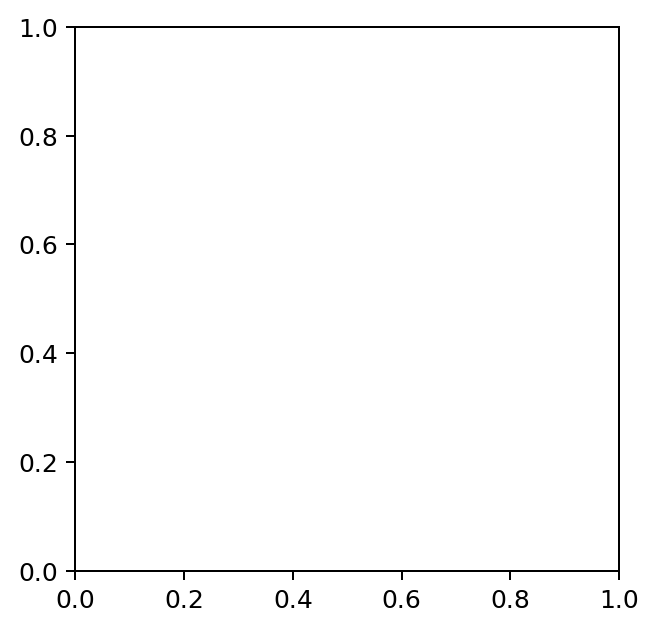

In [237]:
test = np.histogram2d(all_storms_ds.where(Experiment=='CTL',drop=True).Lat_gen,all_storms_ds.where(Experiment=='CTL',drop=True).Lon_gen,bins=[lat_bins, lon_bins], range = [lat_range, lon_range])
plt.imshow(test,interpolation='nearest', origin='low',extent=[lon_bins[0], lon_bins[-1], lat_bins[0], lat_bins[-1]])





In [192]:
all_storms_ds.where(Experiment=='2X',drop=True)

<xarray.Dataset>
Dimensions:     (index: 578)
Coordinates:
  * index       (index) int64 600 601 602 603 604 ... 1173 1174 1175 1176 1177
Data variables:
    Count       (index) float64 601.0 602.0 603.0 ... 1.177e+03 1.178e+03
    Lat_gen     (index) float64 19.86 17.39 31.39 11.83 ... 15.93 22.46 9.49
    Lon_gen     (index) float64 294.6 344.3 302.0 282.6 ... 348.3 293.1 278.5
    Lat_lys     (index) float64 39.42 59.78 52.61 23.28 ... 44.71 41.01 9.49
    Lon_lys     (index) float64 294.0 328.4 326.7 278.1 ... 358.3 314.3 278.5
    Lat_max     (index) float64 35.82 32.03 41.96 27.24 ... 35.53 39.93 9.49
    Lon_max     (index) float64 288.8 321.1 311.8 281.8 ... 315.4 310.6 278.5
    Wind_max    (index) float64 20.78 32.29 29.5 31.06 ... 38.8 30.96 22.57 nan
    Genesis     (index) float64 0.0 3.0 13.0 5.0 9.0 0.0 ... 2.0 3.0 3.0 1.0 2.0
    Lysis       (index) float64 24.0 87.0 67.0 59.0 26.0 ... 58.0 93.0 18.0 2.0
    Year        (index) float64 101.0 101.0 101.0 101.0 ... 200.0 

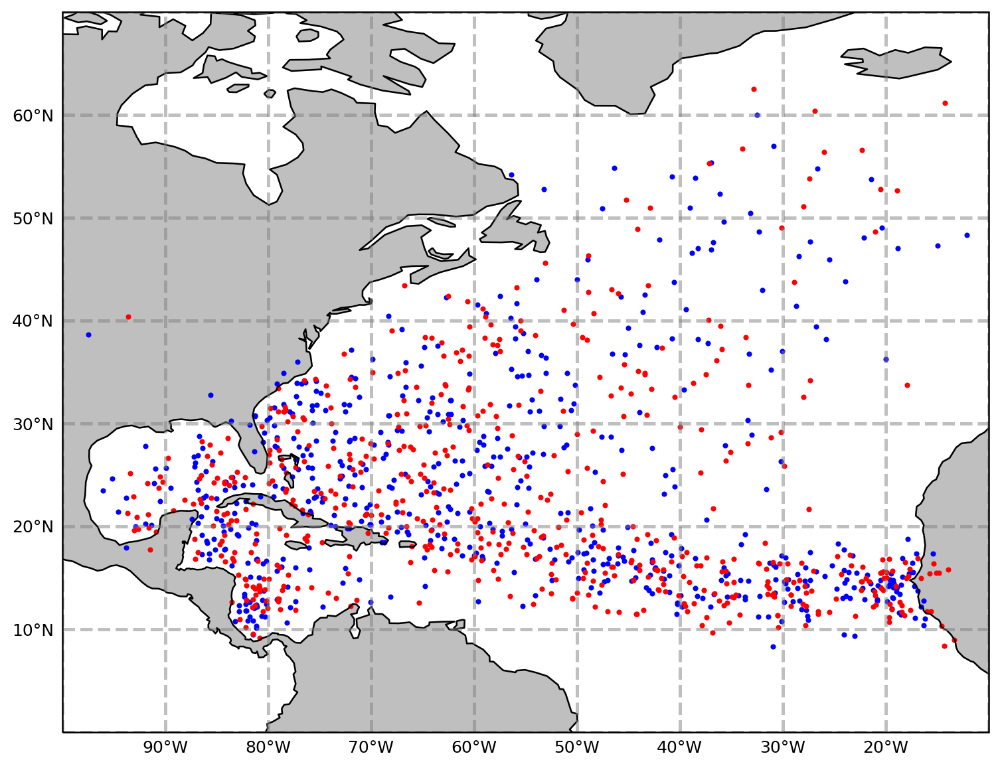

In [48]:
#genesis 
plt.figure(figsize=(10,8))

ax2=plt.subplot(1,1,1,projection=ccrs.PlateCarree())
ax2.set_extent([-100, -10, 0, 70], ccrs.PlateCarree())
plt.scatter(all_storms_df_cp[all_storms_df_cp.Experiment == 'CTL'].Lon_gen,all_storms_df_cp[all_storms_df_cp.Experiment == 'CTL'].Lat_gen,color='b',s=5,transform=ccrs.PlateCarree())
plt.scatter(all_storms_df_cp[all_storms_df_cp.Experiment == '2X'].Lon_gen,all_storms_df_cp[all_storms_df_cp.Experiment == '2X'].Lat_gen,color='r',s=5,transform=ccrs.PlateCarree())
gl=ax2.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=2, color='gray', alpha=0.5, linestyle='--')
gl.xlabels_top=False
gl.ylabels_right=False
gl.xformatter=LONGITUDE_FORMATTER
gl.yformatter=LATITUDE_FORMATTER
ax2.add_feature(cfeature.LAND, facecolor='0.75')
ax2.coastlines()

# TC vars 

In [31]:
lambda_2x = xr.open_dataset('/tigress/gvecchi/ANALYSIS/MODEL_TC_ANALYSIS/%s_TC_VARS/%s/lambda.nc'%(exp['model'],exp['plus2x'])).rename({'Y2':'lat','X2':'lon'}).LAMBDA.squeeze(drop=True)
lambda_ctl = xr.open_dataset('/tigress/gvecchi/ANALYSIS/MODEL_TC_ANALYSIS/%s_TC_VARS/%s/lambda.nc'%(exp['model'],exp['ctl'])).rename({'Y2':'lat','X2':'lon'}).LAMBDA.squeeze(drop=True)
chitang_2x = xr.open_dataset('/tigress/gvecchi/ANALYSIS/MODEL_TC_ANALYSIS/%s_TC_VARS/%s/chitang.nc'%(exp['model'],exp['plus2x'])).rename({'Y2':'lat','X2':'lon'}).CHI.squeeze(drop=True)
chitang_ctl = xr.open_dataset('/tigress/gvecchi/ANALYSIS/MODEL_TC_ANALYSIS/%s_TC_VARS/%s/chitang.nc'%(exp['model'],exp['ctl'])).rename({'Y2':'lat','X2':'lon'}).CHI.squeeze(drop=True)
thermvars_2x = xr.open_dataset('/tigress/gvecchi/ANALYSIS/MODEL_TC_ANALYSIS/%s_TC_VARS/%s/thermvars.nc'%(exp['model'],exp['plus2x'])).rename({'Y2':'lat','X2':'lon'})
thermvars_ctl = xr.open_dataset('/tigress/gvecchi/ANALYSIS/MODEL_TC_ANALYSIS/%s_TC_VARS/%s/thermvars.nc'%(exp['model'],exp['ctl'])).rename({'Y2':'lat','X2':'lon'})




In [6]:
PI_2x = thermvars_2x.PI.squeeze(drop=True)
PI_ctl = thermvars_ctl.PI.squeeze(drop=True)


In [24]:
lambda_2x

<xarray.DataArray 'LAMBDA' (TIME: 600, lat: 90, lon: 180)>
[9720000 values with dtype=float64]
Coordinates:
  * lon      (lon) float64 1.0 3.0 5.0 7.0 9.0 ... 351.0 353.0 355.0 357.0 359.0
  * lat      (lat) float64 -89.0 -87.0 -85.0 -83.0 -81.0 ... 83.0 85.0 87.0 89.0
  * TIME     (TIME) object 0101-01-16 12:00:00 ... 0150-12-16 12:00:00
Attributes:
    long_name:  Tang and Emanuel (2012) Ventilation Index

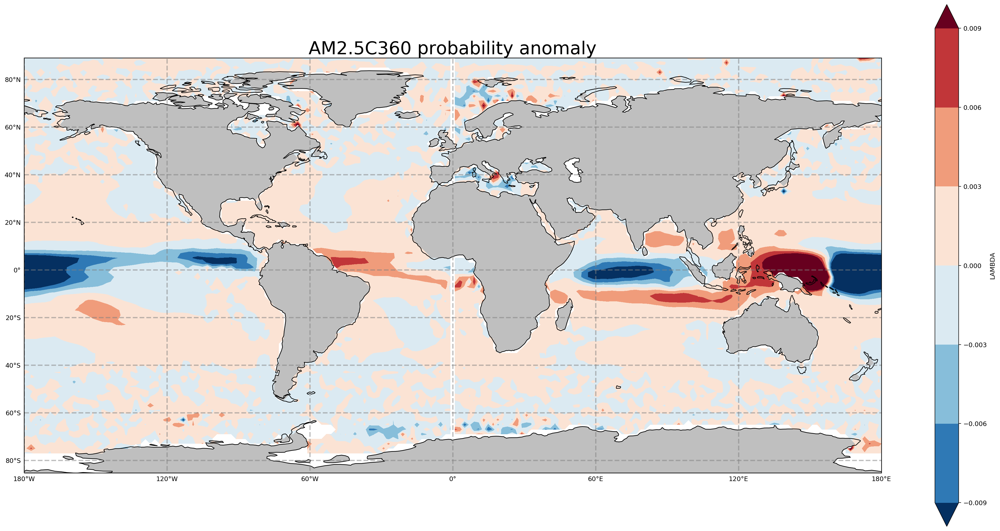

In [32]:
#p_lambda_2x = 0.02/(0.02 + lambda_2x.groupby('TIME.month').mean('TIME').sel(month=[6,7,8,9,10,11]).mean('month'))
#p_lambda_ctl = 0.02/(0.02 + lambda_ctl.groupby('TIME.month').mean('TIME').sel(month=[6,7,8,9,10,11]).mean('month'))
p_lambda_2x = 0.02/(0.02 + lambda_2x.mean('TIME'))
p_lambda_ctl = 0.02/(0.02 + lambda_ctl.mean('TIME'))


plt.figure(figsize=(30,15))

ax2=plt.subplot(1,1,1,projection=ccrs.PlateCarree())
(p_lambda_2x-p_lambda_ctl).plot.contourf(robust=True,cmap='RdBu_r',vmax=0.009)
#ax2.set_extent([-100, 0, 0, 70], ccrs.PlateCarree())
gl=ax2.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=2, color='gray', alpha=0.5, linestyle='--')
gl.xlabels_top=False
gl.ylabels_right=False
gl.xformatter=LONGITUDE_FORMATTER
gl.yformatter=LATITUDE_FORMATTER
ax2.add_feature(cfeature.LAND, facecolor='0.75')
ax2.coastlines()

ax2.set_title(f'%s probability anomaly'%exp['model'],fontsize=28)

plt.savefig(f'%s_p_lambda.png'%exp['model'])
#should we be looking at Jun-Nov?

#log(VI) probability form
#poleward of 10 degrees
#0.02 / (0.02 + lambda)

Text(0.5, 1.0, 'HIRAM CHI anomaly')

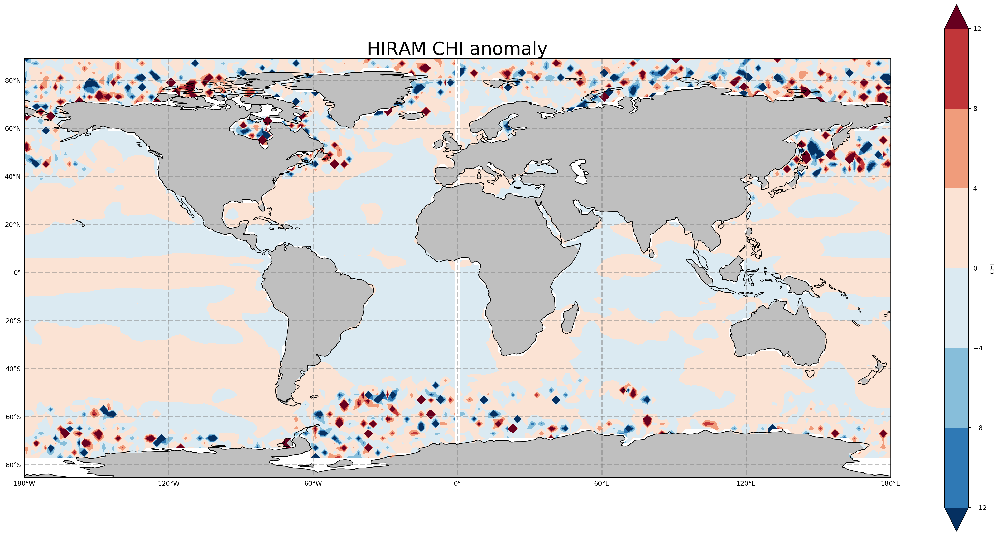

In [61]:
plt.figure(figsize=(30,15))

ax2=plt.subplot(1,1,1,projection=ccrs.PlateCarree())
(chitang_2x-chitang_ctl).mean('TIME').plot.contourf(robust=True,cmap='RdBu_r')
gl=ax2.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=2, color='gray', alpha=0.5, linestyle='--')
gl.xlabels_top=False
gl.ylabels_right=False
gl.xformatter=LONGITUDE_FORMATTER
gl.yformatter=LATITUDE_FORMATTER
ax2.add_feature(cfeature.LAND, facecolor='0.75')
ax2.coastlines()

ax2.set_title(f'%s CHI anomaly'%exp['model'],fontsize=28)
#should we be looking at Jun-Nov?

# look at 1/chi or log(chi)
#tc season

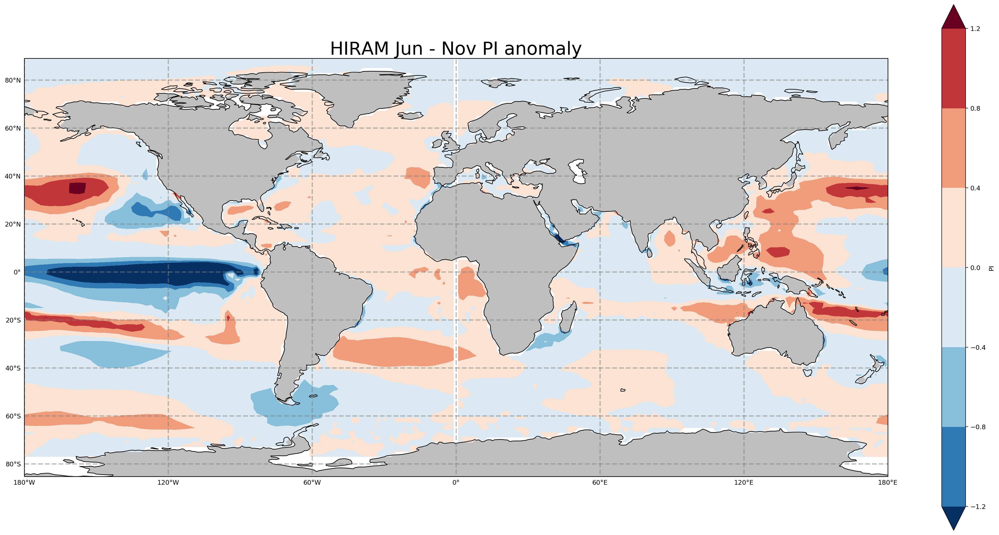

In [62]:
plt.figure(figsize=(30,15))

ax2=plt.subplot(1,1,1,projection=ccrs.PlateCarree())
(PI_2x-PI_ctl).groupby('TIME.month').mean('TIME').sel(month=[6,7,8,9,10,11]).mean('month').plot.contourf(robust=True,cmap='RdBu_r')
gl=ax2.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=2, color='gray', alpha=0.5, linestyle='--')
gl.xlabels_top=False
gl.ylabels_right=False
gl.xformatter=LONGITUDE_FORMATTER
gl.yformatter=LATITUDE_FORMATTER
ax2.add_feature(cfeature.LAND, facecolor='0.75')
ax2.coastlines()

ax2.set_title(f'%s Jun - Nov PI anomaly'%exp['model'],fontsize=28)


#plt.savefig(f'%s_PI.png'%exp['model'])



<xarray.DataArray 'PI' (TIME: 1188, lat: 90, lon: 180)>
[19245600 values with dtype=float64]
Coordinates:
  * lon      (lon) float64 1.0 3.0 5.0 7.0 9.0 ... 351.0 353.0 355.0 357.0 359.0
  * lat      (lat) float64 -89.0 -87.0 -85.0 -83.0 -81.0 ... 83.0 85.0 87.0 89.0
  * TIME     (TIME) object 0101-01-16 12:00:00 ... 0199-12-16 12:00:00
Attributes:
    long_name:  Bister and Emanuel PI - Reversible Ascent, gridpoints more th...
    units:      m/s

In [ ]:
#look at probability of excedence -- this plot looks like prob on y-axis vs #TCs/year 
#wind shear 850 - 200 mbar (magnitude of vector wind difference) June-Nov or Aug-Oct ((u850-u200)^2 + (v850-v200)^2)^0.5
#look at wenchang's scripts for potential intensity, ventillation index
#maybe cluster the NA tracks
#scratch/gpfs2/wenchang/AM2.5_C360

# 5 clusters for HIRAM, compare to HURDAT
#look at clusters for HURDAT -- only storms that are more than 2 days (at least 48 hours of TS speed)
# try to PICKLE the lons/lats ... u forgot that you need that variable to plot the clusters
# climatological maps of probability (VI) over east pacific & north atlantic


# look at hurdat 1965 - present
# plot the points that are neither warm core or gale

#question -- what metric to use for increase? net increase? i've been recording average change in #tspy 


# count number of seeds in basin 
# multiply change in seeds by control probability and then integrate? 

#5.5.2020
#-do the seed/probability framework help explain these responses?
#-what is the effect on the storms that WOULD BE recorded as an increase?
    # - we dont have anything south of belize , vieques, look there first? 
    
    #for next week:
     #   summarize eastern basin/western basin response for each of 3 models, describe which one is most likely to 
     #  give an increase
    # say : north of 17N, then say eastern basin storms are west of 60W. count # of storms that make it into this 
    # region, describe which of the 3 models have increase/decrease of the storms with tracks in this region

#5.12.2020
#plot % change by lon
#look at different intensity threshholds
#look at 